In [ ]:
pip install BioPython

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
pip install propy3

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
pip install pyfaidx

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# Compute protein descriptors
from propy import PyPro
from propy import AAComposition
from propy import CTD
# from propy.PseAAC import PseAAC

# Build Sequence Object
from Bio.SeqUtils.ProtParam import ProteinAnalysis

# Read Fasta File
from pyfaidx import Fasta

# Grouping iterable
from itertools import chain

# Return file path
import glob

In [ ]:
# Import necessary packages

import pandas as pd
import numpy as np
import json 
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.decomposition import PCA
from sklearn.preprocessing import OrdinalEncoder
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold, GridSearchCV, RandomizedSearchCV
# from sklearn.metrics import accuracy_score, f1_score, matthews_corrcoef, confusion_matrix, ConfusionMatrixDisplay, classification_report, plot_confusion_matrix

from sklearn.svm import SVC
from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier

from sklearn.preprocessing import MinMaxScaler, OrdinalEncoder, StandardScaler
from sklearn.model_selection import cross_val_score, cross_validate, cross_val_predict
from sklearn.metrics import make_scorer

from sklearn.feature_selection import RFE, RFECV
from sklearn.pipeline import Pipeline

In [ ]:
# Feature Extraction

def ExtractFeaturesFasta(fastafile):
    
    new_enzymes = []
    for file in glob.glob(fastafile):
      new_enzymes.append(file)
    
    for f in new_enzymes:
        fa = Fasta(f)
        # empty list to save the features
        listing = []
        
        for seq in fa:
            # Make sure the sequence is a string
            s = str(seq)
            
            # replace the unappropriate enzyme sequence to A
            s = s.replace('X','A')
            s = s.replace('x','A')
            s = s.replace('U','A')
            s = s.replace('Z','A')
            s = s.replace('B','A')
            s = s.replace('O','A')

            # Calculating primary features
            analysed_seq = ProteinAnalysis(s)
            wt = analysed_seq.molecular_weight()
            arm = analysed_seq.aromaticity()
            instab = analysed_seq.instability_index()
            flex = analysed_seq.flexibility()
            pI = analysed_seq.isoelectric_point()

            # Create list for identity of protein - Name and Seq
            pId = [seq.name, s]

            # create a list for the primary features
            pFeatures = [len(seq), wt, arm, instab, pI]

            # Get Amino Acid Composition (AAC), Composition Transition Distribution (CTD) and Dipeptide Composition (DPC)
            resultAAC = AAComposition.CalculateAAComposition(s)
            resultCTD = CTD.CalculateCTD(s)
            resultDPC = AAComposition.CalculateDipeptideComposition(s)

            # Collect all the features into lists
            aacFeatures = [j for i,j in resultAAC.items()]
            ctdFeatures = [l for k,l in resultCTD.items()]
            dpcFeatures = [n for m,n in resultDPC.items()]
            listing.append(pId + pFeatures + aacFeatures + ctdFeatures + dpcFeatures)
            
        # Collect feature names
        IDname = ['Name','Seq']
        Pname = ['SeqLength','Weight','Aromaticity','Instability','IsoelectricPoint']
        AACname = [i for i,j in resultAAC.items()]
        CTDname = [k for k,l in resultCTD.items()]
        DPCname = [m for m,n in resultDPC.items()]
        feature_names  = []
        feature_names.append(IDname+Pname+AACname+DPCname+CTDname)
        flatten_list = list(chain.from_iterable(feature_names))

        # create dataframe using all extracted features and the names
        allFeatures = pd.DataFrame(listing, columns = flatten_list)

        # creating dictionary containing all set of name of the features
        allFearuresName = {'primary':Pname, 'AAC':AACname, 'CTD':CTDname, 'DPC':DPCname}
       

        return allFeatures, allFearuresName


In [ ]:
positiveDf, positiveFeatureNames = ExtractFeaturesFasta('/content/cutoffData.fasta')

print('\n')
print('The shape of the negative enzyme dataframe')
print('Number of rows:    ', positiveDf.shape[0])
print('Number of columns: ', positiveDf.shape[1])

positiveDf.head()



The shape of the negative peptide dataframe
Number of rows:     18000
Number of columns:  574


,Name,Seq,SeqLength,Weight,Aromaticity,Instability,IsoelectricPoint,A,R,N,...,_HydrophobicityD2001,_HydrophobicityD2025,_HydrophobicityD2050,_HydrophobicityD2075,_HydrophobicityD2100,_HydrophobicityD3001,_HydrophobicityD3025,_HydrophobicityD3050,_HydrophobicityD3075,_HydrophobicityD3100
0,class4_1,MKNTSLSTTLTMNDTIAAIATPLGKGAISIIKISGHNALNILKQLT...,461,51362.8187,0.058568,36.863124,5.698359,7.375,2.603,6.291,...,0.87,0.00,0.00,0.22,0.00,0.43,0.00,0.00,0.00,0.22
1,class0_2,MQNSALKAWLDSSYLSGSNQSWIEQLYEDFLTDPDSVDANWRLTFQ...,933,104857.4196,0.086817,41.159271,6.153071,8.682,6.002,3.537,...,0.75,0.64,0.43,0.11,0.21,0.21,0.21,0.21,0.21,0.75
2,class3_3,MRVIRPVEHADIAALMQLAGKTGGGLTSLPANEATLAARIERALKT...,344,38279.2351,0.093023,33.179360,6.145511,10.756,6.977,2.907,...,0.87,0.00,0.00,0.29,0.00,0.00,0.00,0.00,0.00,0.29
3,class1_4,MTTIKPAVDLAARAAIATRTEALFRRSGALRDGHFLLKSGRHSDAY...,224,23341.4347,0.058036,39.767411,7.722964,16.071,8.929,0.000,...,1.35,0.45,0.00,0.00,0.00,0.00,0.00,0.00,0.45,0.00
4,class6_5,MLTKDLSVTFCGVKFPNPFCLSSSPVGNCYEMCAKAYDTGWGGIVF...,411,45050.3468,0.075426,38.941606,5.466854,8.029,3.893,3.893,...,0.24,1.22,0.00,0.24,0.00,0.24,0.49,0.00,0.24,0.00


In [ ]:
negativeDf, negativeFeatureNames = ExtractFeaturesFasta('/content/NonEnz_3k.fasta')
print('\n')
print('The shape of the negative enzyme dataframe')
print('Number of rows:    ', negativeDf.shape[0])
print('Number of columns: ', negativeDf.shape[1])

pd.set_option('display.max_columns', None)
negativeDf.head()




The shape of the negative peptide dataframe
Number of rows:     3000
Number of columns:  574


,Name,Seq,SeqLength,Weight,Aromaticity,Instability,IsoelectricPoint,A,R,N,D,C,E,Q,G,H,I,L,K,M,F,P,S,T,W,Y,V,AA,AR,AN,AD,AC,AE,AQ,AG,AH,AI,AL,AK,AM,AF,AP,AS,AT,AW,AY,AV,RA,RR,RN,RD,RC,RE,RQ,RG,RH,RI,RL,RK,RM,RF,RP,RS,RT,RW,RY,RV,NA,NR,NN,ND,NC,NE,NQ,NG,NH,NI,NL,NK,NM,NF,NP,NS,NT,NW,NY,NV,DA,DR,DN,DD,DC,DE,DQ,DG,DH,DI,DL,DK,DM,DF,DP,DS,DT,DW,DY,DV,CA,CR,CN,CD,CC,CE,CQ,CG,CH,CI,CL,CK,CM,CF,CP,CS,CT,CW,CY,CV,EA,ER,EN,ED,EC,EE,EQ,EG,EH,EI,EL,EK,EM,EF,EP,ES,ET,EW,EY,EV,QA,QR,QN,QD,QC,QE,QQ,QG,QH,QI,QL,QK,QM,QF,QP,QS,QT,QW,QY,QV,GA,GR,GN,GD,GC,GE,GQ,GG,GH,GI,GL,GK,GM,GF,GP,GS,GT,GW,GY,GV,HA,HR,HN,HD,HC,HE,HQ,HG,HH,HI,HL,HK,HM,HF,HP,HS,HT,HW,HY,HV,IA,IR,IN,ID,IC,IE,IQ,IG,IH,II,IL,IK,IM,IF,IP,IS,IT,IW,IY,IV,LA,LR,LN,LD,LC,LE,LQ,LG,LH,LI,LL,LK,LM,LF,LP,LS,LT,LW,LY,LV,KA,KR,KN,KD,KC,KE,KQ,KG,KH,KI,KL,KK,KM,KF,KP,KS,KT,KW,KY,KV,MA,MR,MN,MD,MC,ME,MQ,MG,MH,MI,ML,MK,MM,MF,MP,MS,MT,MW,MY,MV,FA,FR,FN,FD,FC,FE,FQ,FG,FH,FI,FL,FK,FM,FF,FP,FS,FT,FW,FY,FV,PA,PR,PN,PD,PC,PE,PQ,PG,PH,PI,PL,PK,PM,PF,PP,PS,PT,PW,PY,PV,SA,SR,SN,SD,SC,SE,SQ,SG,SH,SI,SL,SK,SM,SF,SP,SS,ST,SW,SY,SV,TA,TR,TN,TD,TC,TE,TQ,TG,TH,TI,TL,TK,TM,TF,TP,TS,TT,TW,TY,TV,WA,WR,WN,WD,WC,WE,WQ,WG,WH,WI,WL,WK,WM,WF,WP,WS,WT,WW,WY,WV,YA,YR,YN,YD,YC,YE,YQ,YG,YH,YI,YL,YK,YM,YF,YP,YS,YT,YW,YY,YV,VA,VR,VN,VD,VC,VE,VQ,VG,VH,VI,VL,VK,VM,VF,VP,VS,VT,VW,VY,VV,_PolarizabilityC1,_PolarizabilityC2,_PolarizabilityC3,_SolventAccessibilityC1,_SolventAccessibilityC2,_SolventAccessibilityC3,_SecondaryStrC1,_SecondaryStrC2,_SecondaryStrC3,_ChargeC1,_ChargeC2,_ChargeC3,_PolarityC1,_PolarityC2,_PolarityC3,_NormalizedVDWVC1,_NormalizedVDWVC2,_NormalizedVDWVC3,_HydrophobicityC1,_HydrophobicityC2,_HydrophobicityC3,_PolarizabilityT12,_PolarizabilityT13,_PolarizabilityT23,_SolventAccessibilityT12,_SolventAccessibilityT13,_SolventAccessibilityT23,_SecondaryStrT12,_SecondaryStrT13,_SecondaryStrT23,_ChargeT12,_ChargeT13,_ChargeT23,_PolarityT12,_PolarityT13,_PolarityT23,_NormalizedVDWVT12,_NormalizedVDWVT13,_NormalizedVDWVT23,_HydrophobicityT12,_HydrophobicityT13,_HydrophobicityT23,_PolarizabilityD1001,_PolarizabilityD1025,_PolarizabilityD1050,_PolarizabilityD1075,_PolarizabilityD1100,_PolarizabilityD2001,_PolarizabilityD2025,_PolarizabilityD2050,_PolarizabilityD2075,_PolarizabilityD2100,_PolarizabilityD3001,_PolarizabilityD3025,_PolarizabilityD3050,_PolarizabilityD3075,_PolarizabilityD3100,_SolventAccessibilityD1001,_SolventAccessibilityD1025,_SolventAccessibilityD1050,_SolventAccessibilityD1075,_SolventAccessibilityD1100,_SolventAccessibilityD2001,_SolventAccessibilityD2025,_SolventAccessibilityD2050,_SolventAccessibilityD2075,_SolventAccessibilityD2100,_SolventAccessibilityD3001,_SolventAccessibilityD3025,_SolventAccessibilityD3050,_SolventAccessibilityD3075,_SolventAccessibilityD3100,_SecondaryStrD1001,_SecondaryStrD1025,_SecondaryStrD1050,_SecondaryStrD1075,_SecondaryStrD1100,_SecondaryStrD2001,_SecondaryStrD2025,_SecondaryStrD2050,_SecondaryStrD2075,_SecondaryStrD2100,_SecondaryStrD3001,_SecondaryStrD3025,_SecondaryStrD3050,_SecondaryStrD3075,_SecondaryStrD3100,_ChargeD1001,_ChargeD1025,_ChargeD1050,_ChargeD1075,_ChargeD1100,_ChargeD2001,_ChargeD2025,_ChargeD2050,_ChargeD2075,_ChargeD2100,_ChargeD3001,_ChargeD3025,_ChargeD3050,_ChargeD3075,_ChargeD3100,_PolarityD1001,_PolarityD1025,_PolarityD1050,_PolarityD1075,_PolarityD1100,_PolarityD2001,_PolarityD2025,_PolarityD2050,_PolarityD2075,_PolarityD2100,_PolarityD3001,_PolarityD3025,_PolarityD3050,_PolarityD3075,_PolarityD3100,_NormalizedVDWVD1001,_NormalizedVDWVD1025,_NormalizedVDWVD1050,_NormalizedVDWVD1075,_NormalizedVDWVD1100,_NormalizedVDWVD2001,_NormalizedVDWVD2025,_NormalizedVDWVD2050,_NormalizedVDWVD2075,_NormalizedVDWVD2100,_NormalizedVDWVD3001,_NormalizedVDWVD3025,_NormalizedVDWVD3050,_NormalizedVDWVD3075,_NormalizedVDWVD3100,_HydrophobicityD1001,_HydrophobicityD1025,_HydrophobicityD1050,_HydrophobicityD1075,_HydrophobicityD1100,_HydrophobicityD2001,_HydrophobicityD2025,_HydrophobicityD2050,_HydrophobicityD2075,_HydrophobicityD2100,_HydrophobicityD3001,_Hyd

In [ ]:
# check if both dataframes have same feature names
if negativeFeatureNames == positiveFeatureNames:
  print('True')
  featureNames = negativeFeatureNames

True


In [ ]:
def categorise(row):  
    return (int(row['Name'][5])+1)
     

In [ ]:
positiveDf['Class'] = positiveDf.apply(lambda row: categorise(row), axis=1)

In [ ]:
positiveDf['Class']

0        5
1        1
2        4
3        2
4        7
        ..
17995    1
17996    1
17997    7
17998    1
17999    1
Name: Class, Length: 18000, dtype: int64

In [ ]:
negativeDf['Class'] = 0

In [ ]:
negativeDf['Class']

0       0
1       0
2       0
3       0
4       0
       ..
2995    0
2996    0
2997    0
2998    0
2999    0
Name: Class, Length: 3000, dtype: int64

In [ ]:
# Adding Target column
# negativeDf['Class'] = 0
# positiveDf['Class'] = 1


# Concatenate both dataframes
enzymeDf = pd.concat([negativeDf, positiveDf])

# enzymeDf = positiveDf

# Shuffling the dataframes
enzymeDf = enzymeDf.sample(frac=1, random_state=1)
enzymeDf.head()

,Name,Seq,SeqLength,Weight,Aromaticity,Instability,IsoelectricPoint,A,R,N,D,C,E,Q,G,H,I,L,K,M,F,P,S,T,W,Y,V,AA,AR,AN,AD,AC,AE,AQ,AG,AH,AI,AL,AK,AM,AF,AP,AS,AT,AW,AY,AV,RA,RR,RN,RD,RC,RE,RQ,RG,RH,RI,RL,RK,RM,RF,RP,RS,RT,RW,RY,RV,NA,NR,NN,ND,NC,NE,NQ,NG,NH,NI,NL,NK,NM,NF,NP,NS,NT,NW,NY,NV,DA,DR,DN,DD,DC,DE,DQ,DG,DH,DI,DL,DK,DM,DF,DP,DS,DT,DW,DY,DV,CA,CR,CN,CD,CC,CE,CQ,CG,CH,CI,CL,CK,CM,CF,CP,CS,CT,CW,CY,CV,EA,ER,EN,ED,EC,EE,EQ,EG,EH,EI,EL,EK,EM,EF,EP,ES,ET,EW,EY,EV,QA,QR,QN,QD,QC,QE,QQ,QG,QH,QI,QL,QK,QM,QF,QP,QS,QT,QW,QY,QV,GA,GR,GN,GD,GC,GE,GQ,GG,GH,GI,GL,GK,GM,GF,GP,GS,GT,GW,GY,GV,HA,HR,HN,HD,HC,HE,HQ,HG,HH,HI,HL,HK,HM,HF,HP,HS,HT,HW,HY,HV,IA,IR,IN,ID,IC,IE,IQ,IG,IH,II,IL,IK,IM,IF,IP,IS,IT,IW,IY,IV,LA,LR,LN,LD,LC,LE,LQ,LG,LH,LI,LL,LK,LM,LF,LP,LS,LT,LW,LY,LV,KA,KR,KN,KD,KC,KE,KQ,KG,KH,KI,KL,KK,KM,KF,KP,KS,KT,KW,KY,KV,MA,MR,MN,MD,MC,ME,MQ,MG,MH,MI,ML,MK,MM,MF,MP,MS,MT,MW,MY,MV,FA,FR,FN,FD,FC,FE,FQ,FG,FH,FI,FL,FK,FM,FF,FP,FS,FT,FW,FY,FV,PA,PR,PN,PD,PC,PE,PQ,PG,PH,PI,PL,PK,PM,PF,PP,PS,PT,PW,PY,PV,SA,SR,SN,SD,SC,SE,SQ,SG,SH,SI,SL,SK,SM,SF,SP,SS,ST,SW,SY,SV,TA,TR,TN,TD,TC,TE,TQ,TG,TH,TI,TL,TK,TM,TF,TP,TS,TT,TW,TY,TV,WA,WR,WN,WD,WC,WE,WQ,WG,WH,WI,WL,WK,WM,WF,WP,WS,WT,WW,WY,WV,YA,YR,YN,YD,YC,YE,YQ,YG,YH,YI,YL,YK,YM,YF,YP,YS,YT,YW,YY,YV,VA,VR,VN,VD,VC,VE,VQ,VG,VH,VI,VL,VK,VM,VF,VP,VS,VT,VW,VY,VV,_PolarizabilityC1,_PolarizabilityC2,_PolarizabilityC3,_SolventAccessibilityC1,_SolventAccessibilityC2,_SolventAccessibilityC3,_SecondaryStrC1,_SecondaryStrC2,_SecondaryStrC3,_ChargeC1,_ChargeC2,_ChargeC3,_PolarityC1,_PolarityC2,_PolarityC3,_NormalizedVDWVC1,_NormalizedVDWVC2,_NormalizedVDWVC3,_HydrophobicityC1,_HydrophobicityC2,_HydrophobicityC3,_PolarizabilityT12,_PolarizabilityT13,_PolarizabilityT23,_SolventAccessibilityT12,_SolventAccessibilityT13,_SolventAccessibilityT23,_SecondaryStrT12,_SecondaryStrT13,_SecondaryStrT23,_ChargeT12,_ChargeT13,_ChargeT23,_PolarityT12,_PolarityT13,_PolarityT23,_NormalizedVDWVT12,_NormalizedVDWVT13,_NormalizedVDWVT23,_HydrophobicityT12,_HydrophobicityT13,_HydrophobicityT23,_PolarizabilityD1001,_PolarizabilityD1025,_PolarizabilityD1050,_PolarizabilityD1075,_PolarizabilityD1100,_PolarizabilityD2001,_PolarizabilityD2025,_PolarizabilityD2050,_PolarizabilityD2075,_PolarizabilityD2100,_PolarizabilityD3001,_PolarizabilityD3025,_PolarizabilityD3050,_PolarizabilityD3075,_PolarizabilityD3100,_SolventAccessibilityD1001,_SolventAccessibilityD1025,_SolventAccessibilityD1050,_SolventAccessibilityD1075,_SolventAccessibilityD1100,_SolventAccessibilityD2001,_SolventAccessibilityD2025,_SolventAccessibilityD2050,_SolventAccessibilityD2075,_SolventAccessibilityD2100,_SolventAccessibilityD3001,_SolventAccessibilityD3025,_SolventAccessibilityD3050,_SolventAccessibilityD3075,_SolventAccessibilityD3100,_SecondaryStrD1001,_SecondaryStrD1025,_SecondaryStrD1050,_SecondaryStrD1075,_SecondaryStrD1100,_SecondaryStrD2001,_SecondaryStrD2025,_SecondaryStrD2050,_SecondaryStrD2075,_SecondaryStrD2100,_SecondaryStrD3001,_SecondaryStrD3025,_SecondaryStrD3050,_SecondaryStrD3075,_SecondaryStrD3100,_ChargeD1001,_ChargeD1025,_ChargeD1050,_ChargeD1075,_ChargeD1100,_ChargeD2001,_ChargeD2025,_ChargeD2050,_ChargeD2075,_ChargeD2100,_ChargeD3001,_ChargeD3025,_ChargeD3050,_ChargeD3075,_ChargeD3100,_PolarityD1001,_PolarityD1025,_PolarityD1050,_PolarityD1075,_PolarityD1100,_PolarityD2001,_PolarityD2025,_PolarityD2050,_PolarityD2075,_PolarityD2100,_PolarityD3001,_PolarityD3025,_PolarityD3050,_PolarityD3075,_PolarityD3100,_NormalizedVDWVD1001,_NormalizedVDWVD1025,_NormalizedVDWVD1050,_NormalizedVDWVD1075,_NormalizedVDWVD1100,_NormalizedVDWVD2001,_NormalizedVDWVD2025,_NormalizedVDWVD2050,_NormalizedVDWVD2075,_NormalizedVDWVD2100,_NormalizedVDWVD3001,_NormalizedVDWVD3025,_NormalizedVDWVD3050,_NormalizedVDWVD3075,_NormalizedVDWVD3100,_HydrophobicityD1001,_HydrophobicityD1025,_HydrophobicityD1050,_HydrophobicityD1075,_HydrophobicityD1100,_HydrophobicityD2001,_HydrophobicityD2025,_HydrophobicityD2050,_HydrophobicityD2075,_HydrophobicityD2100,_HydrophobicityD3001,_Hyd

In [ ]:
classes, freq = np.unique(enzymeDf['Class'], return_counts=True)

print(f'The class {classes[0]} contains {freq[0]} samples')
print(f'The class {classes[1]} contains {freq[1]} samples')
print(f'The class {classes[2]} contains {freq[2]} samples')
print(f'The class {classes[3]} contains {freq[3]} samples')
print(f'The class {classes[4]} contains {freq[4]} samples')
print(f'The class {classes[5]} contains {freq[5]} samples')
print(f'The class {classes[6]} contains {freq[6]} samples')
print(f'The class {classes[7]} contains {freq[7]} samples')

# print(f'The ratio of negative and positive: {round(freq[0]/freq[1],2)} : {freq[1]/freq[1]}')

The class 0 contains 3000 samples
The class 1 contains 2333 samples
The class 2 contains 2423 samples
The class 3 contains 2657 samples
The class 4 contains 2503 samples
The class 5 contains 2569 samples
The class 6 contains 2755 samples
The class 7 contains 2760 samples


In [ ]:
# Checking for null values
enzymeDf.isnull().values.any()

False

In [ ]:
# Statistics Summary
enzymeDf.describe()

,SeqLength,Weight,Aromaticity,Instability,IsoelectricPoint,A,R,N,D,C,E,Q,G,H,I,L,K,M,F,P,S,T,W,Y,V,AA,AR,AN,AD,AC,AE,AQ,AG,AH,AI,AL,AK,AM,AF,AP,AS,AT,AW,AY,AV,RA,RR,RN,RD,RC,RE,RQ,RG,RH,RI,RL,RK,RM,RF,RP,RS,RT,RW,RY,RV,NA,NR,NN,ND,NC,NE,NQ,NG,NH,NI,NL,NK,NM,NF,NP,NS,NT,NW,NY,NV,DA,DR,DN,DD,DC,DE,DQ,DG,DH,DI,DL,DK,DM,DF,DP,DS,DT,DW,DY,DV,CA,CR,CN,CD,CC,CE,CQ,CG,CH,CI,CL,CK,CM,CF,CP,CS,CT,CW,CY,CV,EA,ER,EN,ED,EC,EE,EQ,EG,EH,EI,EL,EK,EM,EF,EP,ES,ET,EW,EY,EV,QA,QR,QN,QD,QC,QE,QQ,QG,QH,QI,QL,QK,QM,QF,QP,QS,QT,QW,QY,QV,GA,GR,GN,GD,GC,GE,GQ,GG,GH,GI,GL,GK,GM,GF,GP,GS,GT,GW,GY,GV,HA,HR,HN,HD,HC,HE,HQ,HG,HH,HI,HL,HK,HM,HF,HP,HS,HT,HW,HY,HV,IA,IR,IN,ID,IC,IE,IQ,IG,IH,II,IL,IK,IM,IF,IP,IS,IT,IW,IY,IV,LA,LR,LN,LD,LC,LE,LQ,LG,LH,LI,LL,LK,LM,LF,LP,LS,LT,LW,LY,LV,KA,KR,KN,KD,KC,KE,KQ,KG,KH,KI,KL,KK,KM,KF,KP,KS,KT,KW,KY,KV,MA,MR,MN,MD,MC,ME,MQ,MG,MH,MI,ML,MK,MM,MF,MP,MS,MT,MW,MY,MV,FA,FR,FN,FD,FC,FE,FQ,FG,FH,FI,FL,FK,FM,FF,FP,FS,FT,FW,FY,FV,PA,PR,PN,PD,PC,PE,PQ,PG,PH,PI,PL,PK,PM,PF,PP,PS,PT,PW,PY,PV,SA,SR,SN,SD,SC,SE,SQ,SG,SH,SI,SL,SK,SM,SF,SP,SS,ST,SW,SY,SV,TA,TR,TN,TD,TC,TE,TQ,TG,TH,TI,TL,TK,TM,TF,TP,TS,TT,TW,TY,TV,WA,WR,WN,WD,WC,WE,WQ,WG,WH,WI,WL,WK,WM,WF,WP,WS,WT,WW,WY,WV,YA,YR,YN,YD,YC,YE,YQ,YG,YH,YI,YL,YK,YM,YF,YP,YS,YT,YW,YY,YV,VA,VR,VN,VD,VC,VE,VQ,VG,VH,VI,VL,VK,VM,VF,VP,VS,VT,VW,VY,VV,_PolarizabilityC1,_PolarizabilityC2,_PolarizabilityC3,_SolventAccessibilityC1,_SolventAccessibilityC2,_SolventAccessibilityC3,_SecondaryStrC1,_SecondaryStrC2,_SecondaryStrC3,_ChargeC1,_ChargeC2,_ChargeC3,_PolarityC1,_PolarityC2,_PolarityC3,_NormalizedVDWVC1,_NormalizedVDWVC2,_NormalizedVDWVC3,_HydrophobicityC1,_HydrophobicityC2,_HydrophobicityC3,_PolarizabilityT12,_PolarizabilityT13,_PolarizabilityT23,_SolventAccessibilityT12,_SolventAccessibilityT13,_SolventAccessibilityT23,_SecondaryStrT12,_SecondaryStrT13,_SecondaryStrT23,_ChargeT12,_ChargeT13,_ChargeT23,_PolarityT12,_PolarityT13,_PolarityT23,_NormalizedVDWVT12,_NormalizedVDWVT13,_NormalizedVDWVT23,_HydrophobicityT12,_HydrophobicityT13,_HydrophobicityT23,_PolarizabilityD1001,_PolarizabilityD1025,_PolarizabilityD1050,_PolarizabilityD1075,_PolarizabilityD1100,_PolarizabilityD2001,_PolarizabilityD2025,_PolarizabilityD2050,_PolarizabilityD2075,_PolarizabilityD2100,_PolarizabilityD3001,_PolarizabilityD3025,_PolarizabilityD3050,_PolarizabilityD3075,_PolarizabilityD3100,_SolventAccessibilityD1001,_SolventAccessibilityD1025,_SolventAccessibilityD1050,_SolventAccessibilityD1075,_SolventAccessibilityD1100,_SolventAccessibilityD2001,_SolventAccessibilityD2025,_SolventAccessibilityD2050,_SolventAccessibilityD2075,_SolventAccessibilityD2100,_SolventAccessibilityD3001,_SolventAccessibilityD3025,_SolventAccessibilityD3050,_SolventAccessibilityD3075,_SolventAccessibilityD3100,_SecondaryStrD1001,_SecondaryStrD1025,_SecondaryStrD1050,_SecondaryStrD1075,_SecondaryStrD1100,_SecondaryStrD2001,_SecondaryStrD2025,_SecondaryStrD2050,_SecondaryStrD2075,_SecondaryStrD2100,_SecondaryStrD3001,_SecondaryStrD3025,_SecondaryStrD3050,_SecondaryStrD3075,_SecondaryStrD3100,_ChargeD1001,_ChargeD1025,_ChargeD1050,_ChargeD1075,_ChargeD1100,_ChargeD2001,_ChargeD2025,_ChargeD2050,_ChargeD2075,_ChargeD2100,_ChargeD3001,_ChargeD3025,_ChargeD3050,_ChargeD3075,_ChargeD3100,_PolarityD1001,_PolarityD1025,_PolarityD1050,_PolarityD1075,_PolarityD1100,_PolarityD2001,_PolarityD2025,_PolarityD2050,_PolarityD2075,_PolarityD2100,_PolarityD3001,_PolarityD3025,_PolarityD3050,_PolarityD3075,_PolarityD3100,_NormalizedVDWVD1001,_NormalizedVDWVD1025,_NormalizedVDWVD1050,_NormalizedVDWVD1075,_NormalizedVDWVD1100,_NormalizedVDWVD2001,_NormalizedVDWVD2025,_NormalizedVDWVD2050,_NormalizedVDWVD2075,_NormalizedVDWVD2100,_NormalizedVDWVD3001,_NormalizedVDWVD3025,_NormalizedVDWVD3050,_NormalizedVDWVD3075,_NormalizedVDWVD3100,_HydrophobicityD1001,_HydrophobicityD1025,_HydrophobicityD1050,_HydrophobicityD1075,_HydrophobicityD1100,_HydrophobicityD2001,_HydrophobicityD2025,_HydrophobicityD2050,_HydrophobicityD2075,_HydrophobicityD2100,_HydrophobicityD3001,_Hydrophobici

<ipython-input-20-7da4aacef681>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(peptideDf.corr(), cmap="YlGnBu")


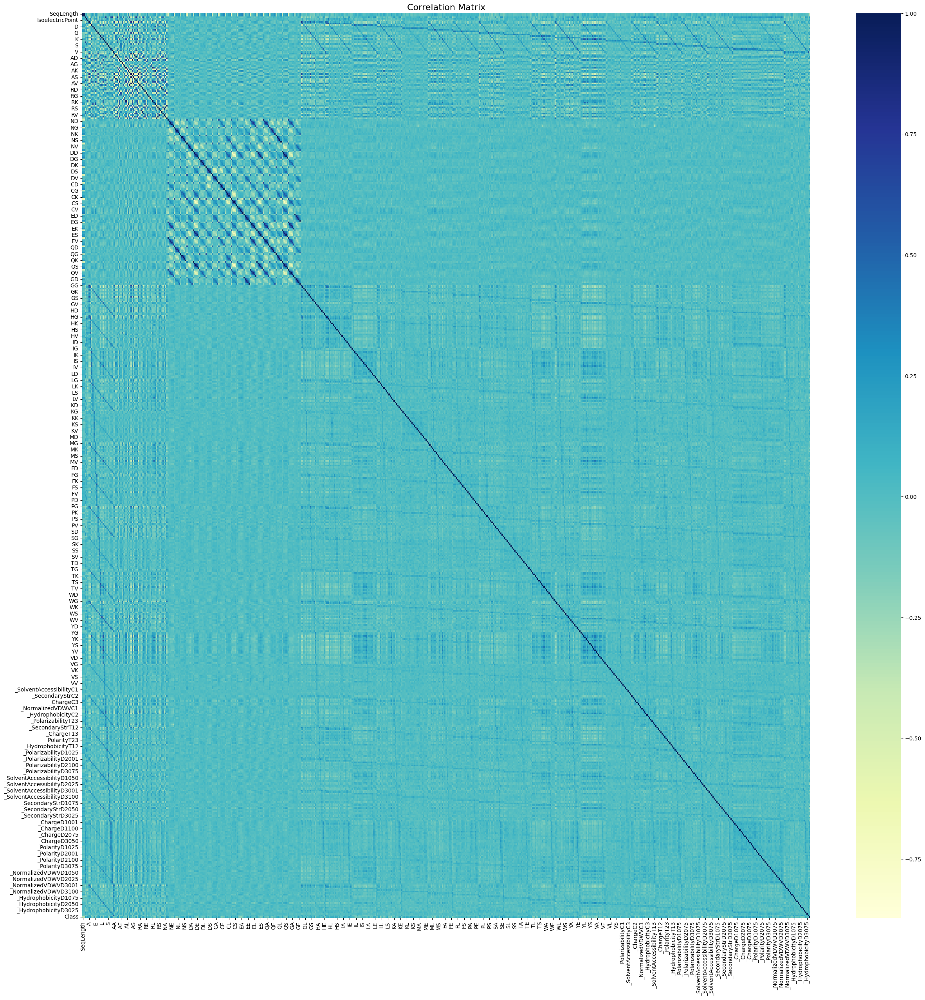

In [ ]:

plt.subplots(figsize=(30, 30))
sns.heatmap(enzymeDf.corr(), cmap="YlGnBu")
plt.title('Correlation Matrix', fontsize=16);
plt.show()

In [ ]:
featureNames = positiveFeatureNames
# Looking at the dictionary containing feature names
for setName in featureNames.keys():
  print(f'{setName:7}:{len(featureNames[setName])}')

primary:5
AAC    :20
CTD    :147
DPC    :400


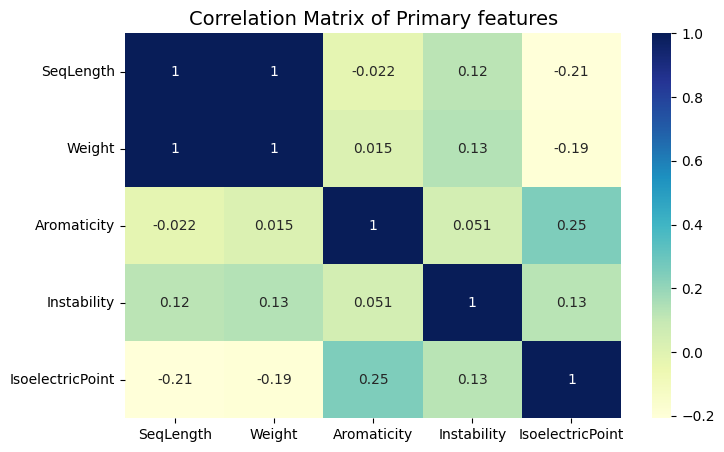

In [ ]:

# Plotting Primary features
f = plt.figure(figsize=(8, 5))
sns.heatmap(enzymeDf[featureNames['primary']].corr(), cmap="YlGnBu", annot=True)

plt.title('Correlation Matrix of Primary features', fontsize=14);
plt.show()

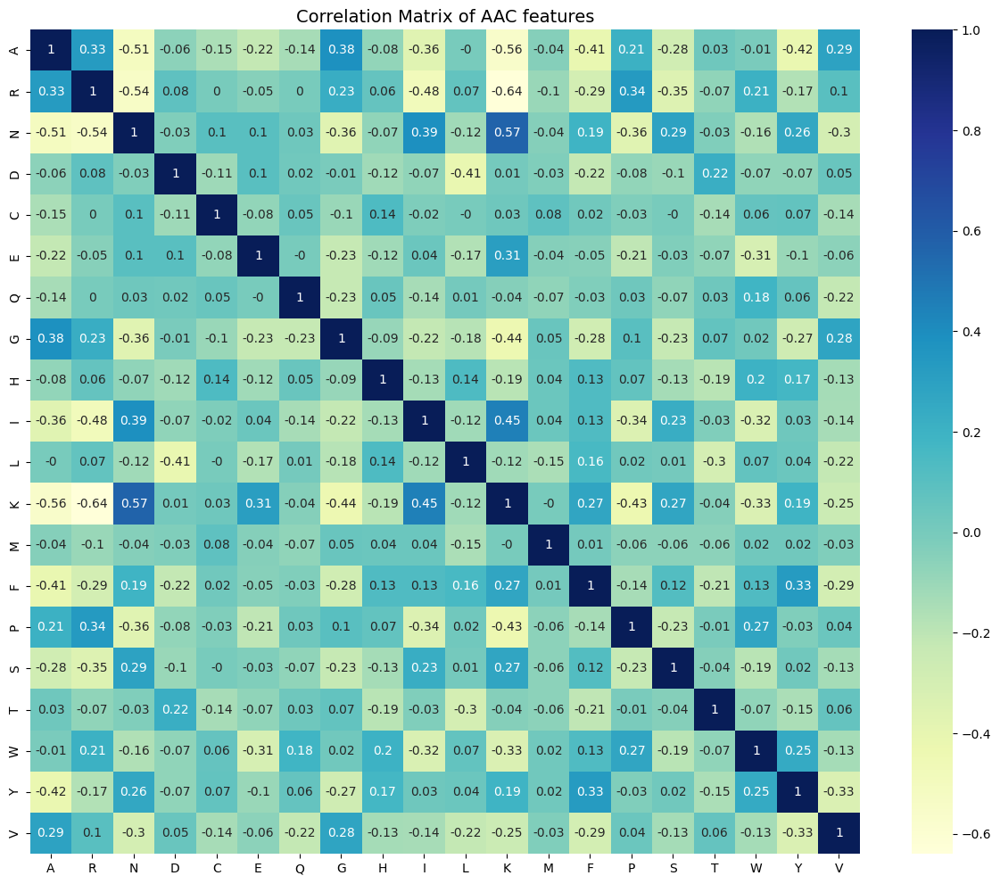

In [ ]:
# Plotting Amino Acid Composition features
f = plt.figure(figsize=(15, 12))
sns.heatmap(round(enzymeDf[featureNames['AAC']].corr(),2), cmap="YlGnBu", annot=True)    # rounding the correlation values to 2 decimal points

plt.title('Correlation Matrix of AAC features', fontsize=14);
plt.show()

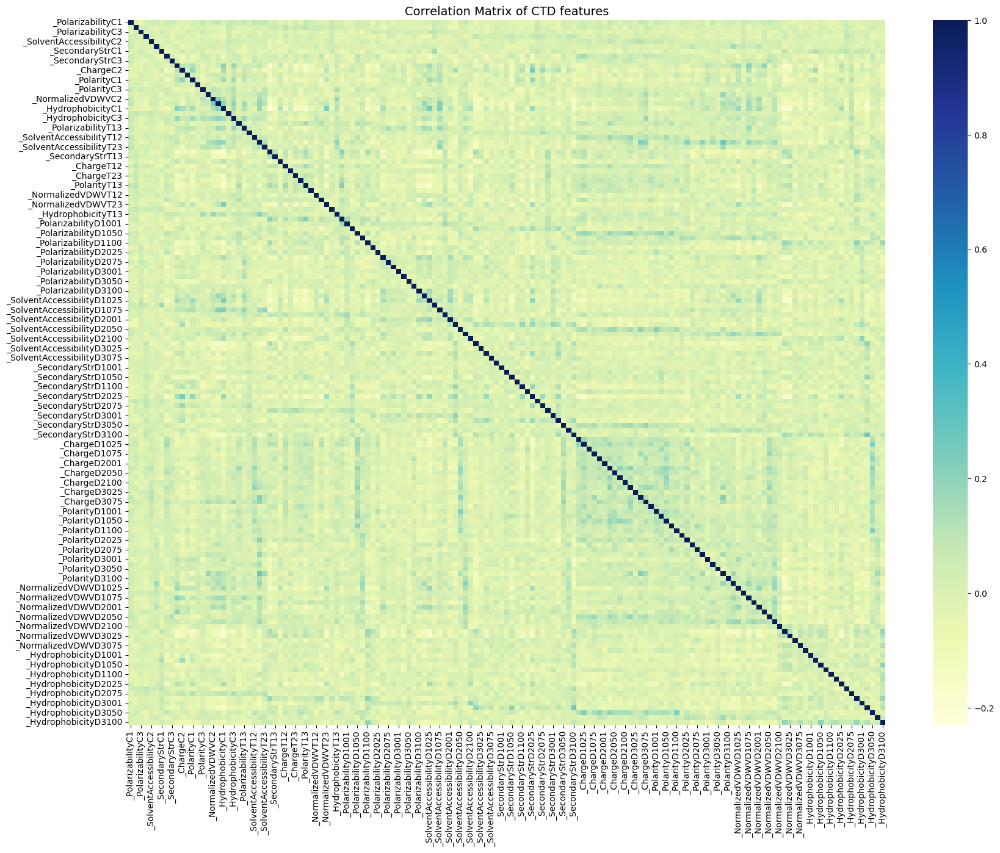

In [ ]:
# Plotting Composition Transition and Distribution features
f = plt.figure(figsize=(20, 15))
sns.heatmap(round(enzymeDf[featureNames['CTD']].corr(),2), cmap="YlGnBu")    # rounding the correlation values to 2 decimal points

plt.title('Correlation Matrix of CTD features', fontsize=14);
plt.show()

In [ ]:
# Get highly correlated features on either side for CTD
highCorrCTD = enzymeDf[featureNames['CTD']].corr()
highCorrCTD = highCorrCTD[(abs(highCorrCTD) > 0.9) & (abs(highCorrCTD) != 1)]

if highCorrCTD.notna().values.any() == False:
  print('No two features are highly correlated in CTD')

No two features are highly correlated in CTD


In [ ]:
# Get highly correlated features on either side for DPC
highCorrDPC = enzymeDf[featureNames['DPC']].corr()
highCorrDPC = highCorrDPC[(abs(highCorrDPC) > 0.9) & (abs(highCorrDPC) != 1)]

if highCorrDPC.notna().values.any() == False:
  print('No two features are highly correlated in DPC')
else:
  print('There are highly correlated features in DPC')

# Get correlation matrix of the selected features table
highCorrDPC = highCorrDPC.where(np.triu(np.ones(highCorrDPC.shape), k=1).astype(bool)).stack().reset_index()
highCorrDPC.rename(columns={'level_0':'feature 1', 'level_1':'feature 2', 0:'Correlation'}, inplace=True)
highCorrDPC

There are highly correlated features in DPC


,feature 1,feature 2,Correlation
0,AA,AS,0.940006
1,AC,AP,0.971666
2,AK,RM,0.908150
3,AM,RA,0.948412
4,AF,AS,0.941253
5,AF,AV,0.933788
6,AP,AY,0.971666
7,RN,RW,0.912053
8,RD,RY,0.950838
9,RF,NR,0.926703


KeyError: ignored

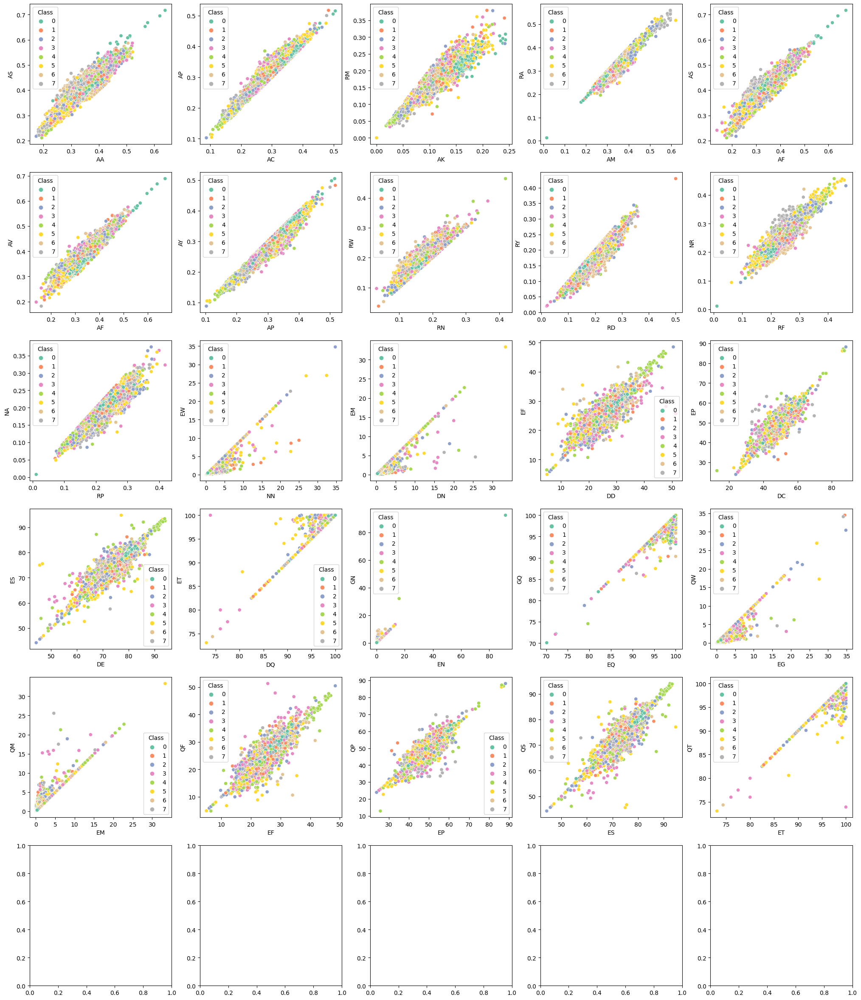

In [ ]:
# scatter plot between highly correlated features
ax = []
for i in range(0,6):
    for j in range(0,5):
        ax.append([i,j])

fig, axes = plt.subplots(5,5,figsize=(25,30))
for i in range(30):
  x,y = ax[i]
  sns.scatterplot(data = enzymeDf, x=enzymeDf[highCorrDPC['feature 1'][i]], y=enzymeDf[highCorrDPC['feature 2'][i]], hue = 'Class', ax=axes[x,y],palette='Set2')
plt.title('Scatter plot between highly correlated features')
plt.show()
     

In [ ]:
# Saving highly correlated features in json file

corr_features_to_remove = list(highCorrDPC['feature 1'])
corr_features_to_remove.append('Weight')       # Adding Weight

In [ ]:
# save the highly correlated features in the json file
with open("corr_features_to_remove.json", "w") as outfile:
    json.dump(corr_features_to_remove, outfile)

Number of features :  5



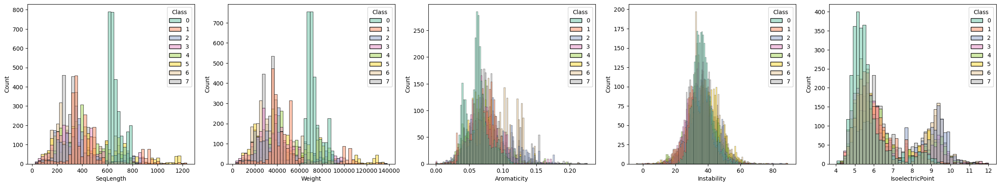

In [ ]:
# reset enzymeDf index
enzymeDf.reset_index(level=0, inplace=True)

# Distribution of primary features
primaryFeatures = featureNames['primary']
length = len(primaryFeatures)
print('Number of features : ',length)
print()

fig, axes = plt.subplots(1,5,figsize=(30,5))
for i in range(length):
  hist = sns.histplot(enzymeDf, x=primaryFeatures[i], hue='Class', ax=axes[i],palette='Set2')
plt.show()
     


Number of features :  20



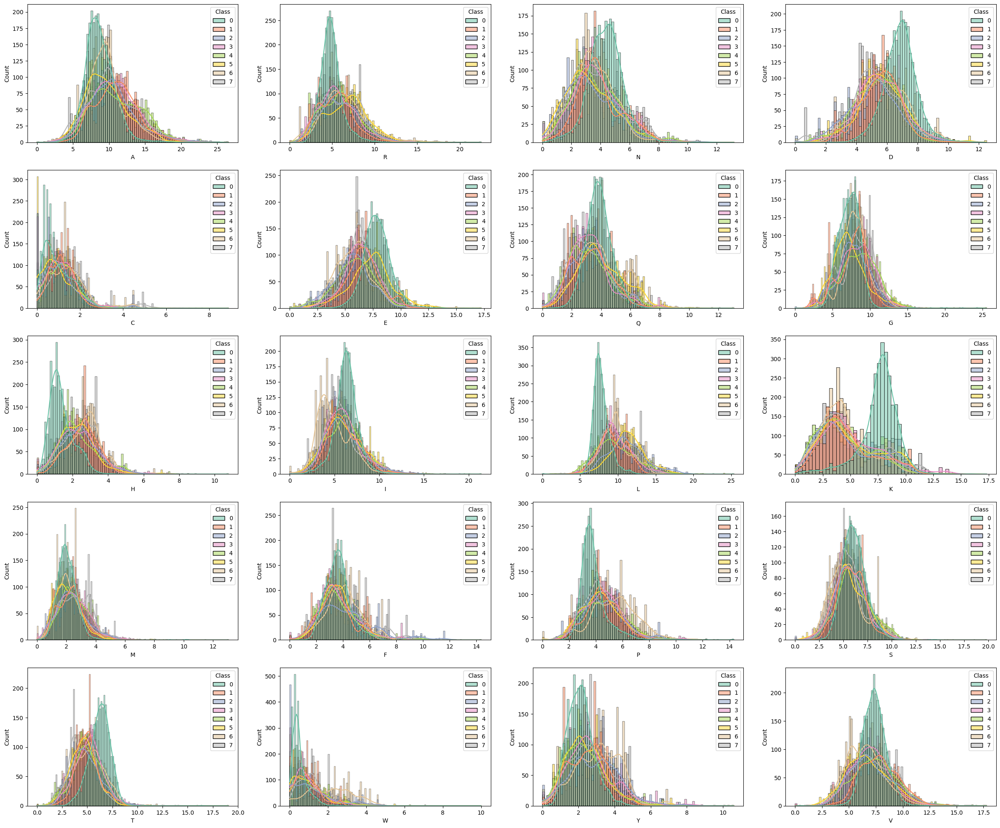

In [ ]:
# Distribution of AAC features
AACFeatures = featureNames['AAC']
length = len(AACFeatures)
print('Number of features : ',length)
print()

ax = []
for i in range(0,5):
    for j in range(0,4):
        ax.append([i,j])

fig, axes = plt.subplots(5,4,figsize=(30,25))
for i in range(length):
  x,y = ax[i]
  sns.histplot(enzymeDf, x=AACFeatures[i], hue='Class', ax=axes[x,y], kde=True,palette='Set2')
plt.show()
     

Number of features :  20



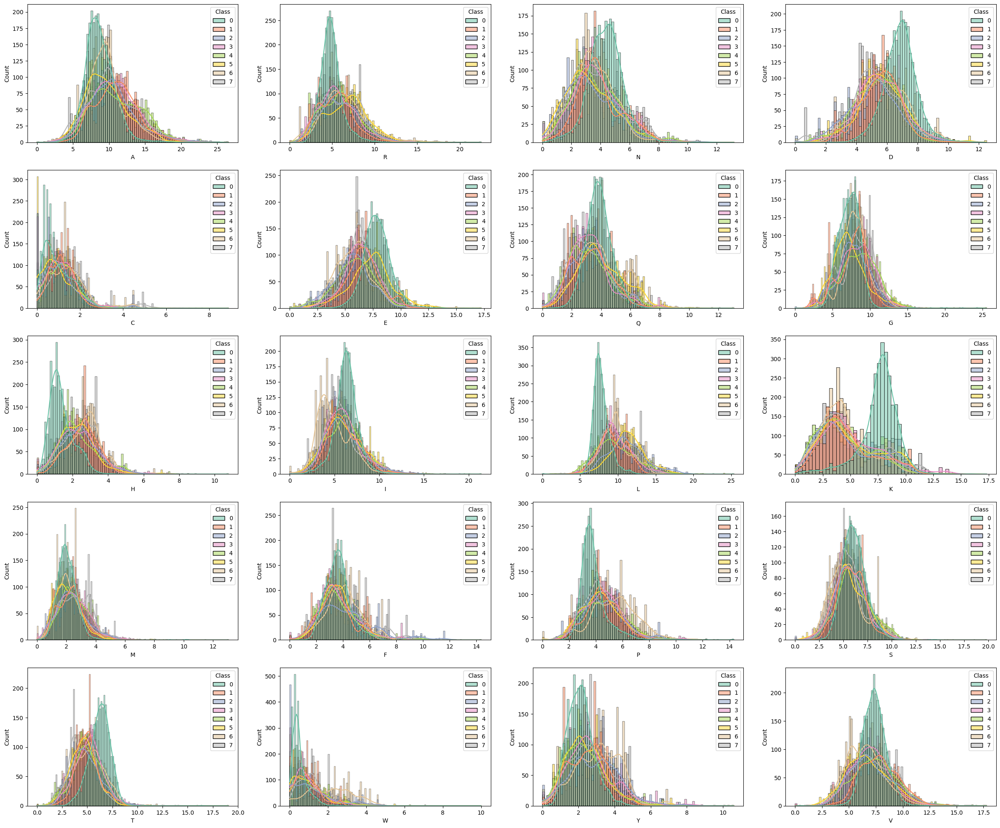

In [ ]:
AACFeatures = featureNames['AAC']
length = len(AACFeatures)
print('Number of features : ',length)
print()

ax = []
for i in range(0,5):
    for j in range(0,4):
        ax.append([i,j])

fig, axes = plt.subplots(5,4,figsize=(30,25))
for i in range(length):
  x,y = ax[i]
  sns.histplot(enzymeDf, x=AACFeatures[i], hue='Class', ax=axes[x,y], kde=True, palette='Set2')
plt.show()


Number of features :  400



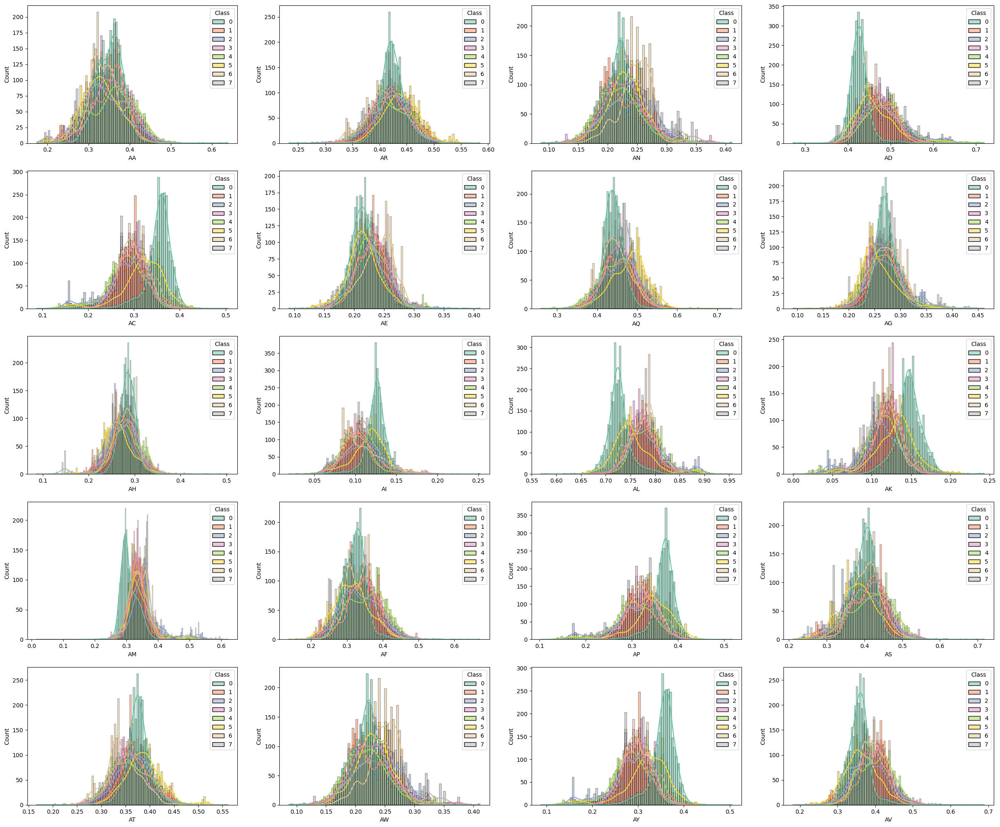

In [ ]:
# Distribution of few DPC features
DPCFeatures = featureNames['DPC']
length = len(DPCFeatures)
print('Number of features : ',length)
print()

ax = []
for i in range(0,5):
    for j in range(0,4):
        ax.append([i,j])

fig, axes = plt.subplots(5,4,figsize=(30,25))
for i in range(len(ax)):
  x,y = ax[i]
  sns.histplot(enzymeDf, x=DPCFeatures[i], hue='Class', ax=axes[x,y], kde=True,palette='Set2')
plt.show()
     

Number of features :  147



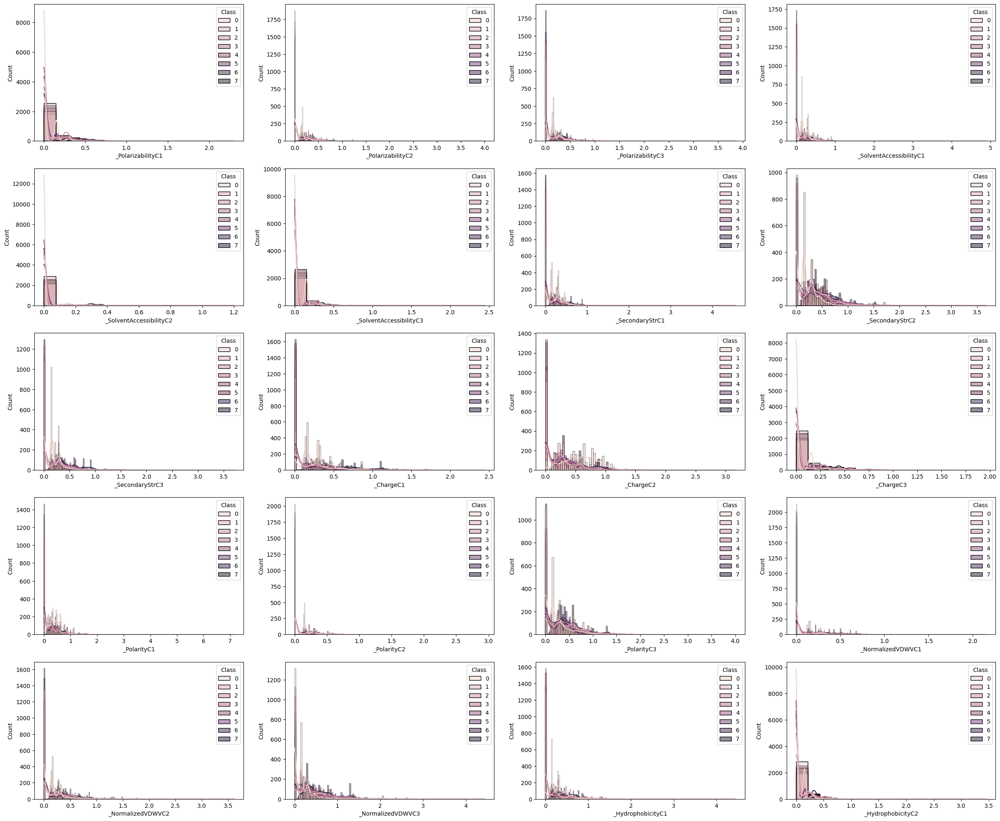

In [ ]:

# Distribution of AAC features
CTDFeatures = featureNames['CTD']
length = len(CTDFeatures)
print('Number of features : ',length)
print()

ax = []
for i in range(0,5):
    for j in range(0,4):
        ax.append([i,j])

fig, axes = plt.subplots(5,4,figsize=(30,25))
for i in range(len(ax)):
  x,y = ax[i]
  sns.histplot(enzymeDf, x=CTDFeatures[i], hue='Class', ax=axes[x,y], kde=True)
plt.show()


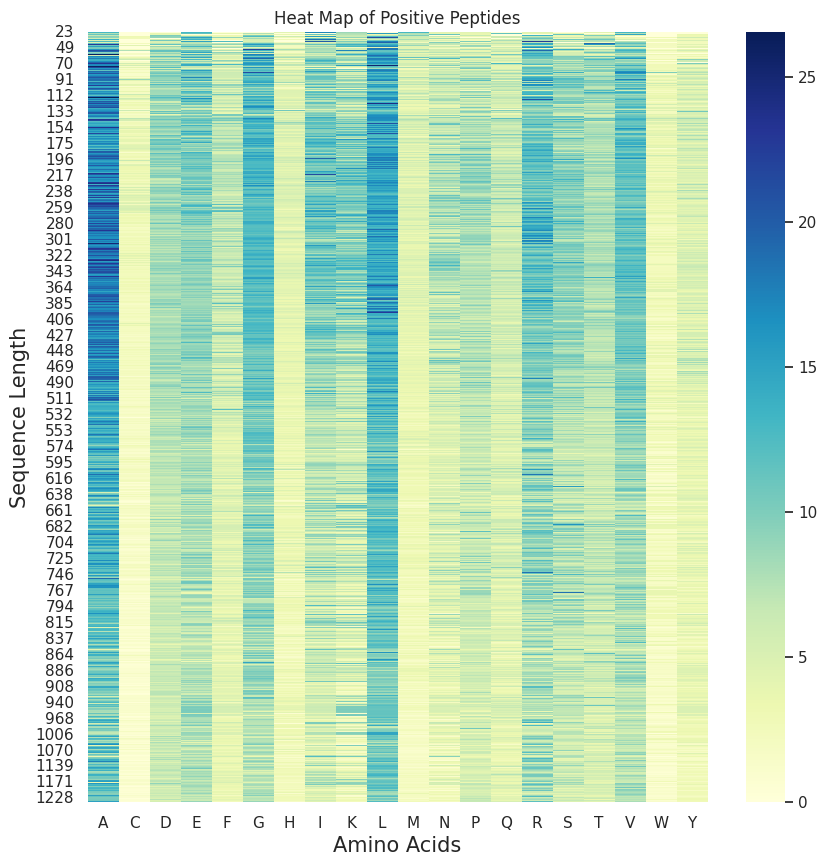

In [ ]:
import warnings
warnings.filterwarnings("ignore")

# Transform to visualize occurances of each enzyme in sequences
aa_seq = ['A','R','N','D','C','E','Q','G','H','I','L','K','M','F','P','S','T','W','Y','V']
AAdf = positiveDf[aa_seq]
AAdf['SeqLength'] = positiveDf['SeqLength']
AAdf[aa_seq].div(AAdf.SeqLength, axis=0)
AAdf = AAdf.sort_values('SeqLength')

aa_seq_df = pd.DataFrame(columns=['SeqLength','Composition','amino_acid'])
aa_df = pd.DataFrame(columns=['SeqLength','Composition','amino_acid'])

for i in aa_seq:
    aa_seq_df['SeqLength'] = AAdf['SeqLength']
    aa_seq_df['amino_acid'] = i
    aa_seq_df['Composition'] = AAdf[i]
    aa_df = pd.concat([aa_df,aa_seq_df],ignore_index=True)

aa_df = aa_df.sort_values('Composition', ascending=False).drop_duplicates(['SeqLength','amino_acid'])

# Create long format
seq = aa_df['SeqLength']
feature = aa_df['amino_acid']
value = aa_df['Composition']
df = pd.DataFrame({'feature': feature, 'seq': seq, 'value': value })

dfe = df[df['feature'] == 'E']
dfe.sort_values('seq').head(10)

seq = aa_df['SeqLength']
feature = aa_df['amino_acid']
value = aa_df['Composition']

# Turn long format into a wide format
df_wide = df.pivot_table( index='seq', columns='feature', values='value')

# plot it
sns.set(rc = {'figure.figsize':(10,10)})
sns.heatmap(df_wide, cmap="YlGnBu")
plt.title('Heat Map of Positive Enzymes')
plt.ylabel('Sequence Length',fontsize=15)
plt.xlabel('Amino Acids',fontsize=15)
plt.show()

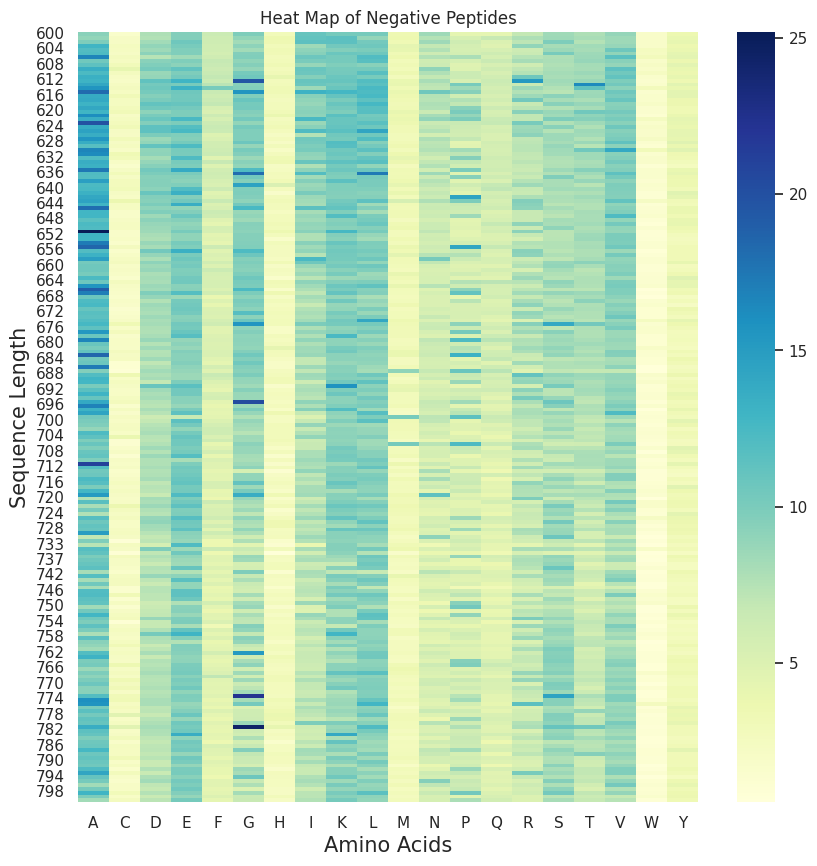

In [ ]:
import warnings
warnings.filterwarnings("ignore")

# Transform to visualize occurances of each enzyme in sequences
aa_seq = ['A','R','N','D','C','E','Q','G','H','I','L','K','M','F','P','S','T','W','Y','V']
AAdf = negativeDf[aa_seq]
AAdf['SeqLength'] = negativeDf['SeqLength']
AAdf[aa_seq].div(AAdf.SeqLength, axis=0)
AAdf = AAdf.sort_values('SeqLength')

aa_seq_df = pd.DataFrame(columns=['SeqLength','Composition','amino_acid'])
aa_df = pd.DataFrame(columns=['SeqLength','Composition','amino_acid'])

for i in aa_seq:
    aa_seq_df['SeqLength'] = AAdf['SeqLength']
    aa_seq_df['amino_acid'] = i
    aa_seq_df['Composition'] = AAdf[i]
    aa_df = pd.concat([aa_df,aa_seq_df],ignore_index=True)

aa_df = aa_df.sort_values('Composition', ascending=False).drop_duplicates(['SeqLength','amino_acid'])

# Create long format
seq = aa_df['SeqLength']
feature = aa_df['amino_acid']
value = aa_df['Composition']
df = pd.DataFrame({'feature': feature, 'seq': seq, 'value': value })

dfe = df[df['feature'] == 'E']
dfe.sort_values('seq').head(10)

seq = aa_df['SeqLength']
feature = aa_df['amino_acid']
value = aa_df['Composition']

# Turn long format into a wide format
df_wide = df.pivot_table( index='seq', columns='feature', values='value')

# plot it
sns.set(rc = {'figure.figsize':(10,10)})
sns.heatmap(df_wide, cmap="YlGnBu")
plt.title('Heat Map of Negative Enzymes')
plt.ylabel('Sequence Length',fontsize=15)
plt.xlabel('Amino Acids',fontsize=15)
plt.show()

#PCA

In [ ]:
y = enzymeDf['Class']
X = enzymeDf.drop(['Name','Seq','Class'],axis=1)

# Printing the shape of the dataframe
print('Shape of X: ',X.shape[0],X.shape[1])
print('Shape of y: ',y.shape[0])

Shape of X:  21000 573
Shape of y:  21000


In [ ]:
scaler = MinMaxScaler()
scaler.fit(X)
X_mms =  pd.DataFrame(scaler.transform(X), index=X.index, columns=X.columns)

In [ ]:
pca = PCA()
pca.fit(X_mms)

pca_df = pd.DataFrame({'Cumulative proportion': np.cumsum(pca.explained_variance_ratio_)})
pca_df = pca_df.transpose()
pca_df.columns = ['PC{}'.format(i) for i in range(1, len(pca_df.columns) + 1)]
pd.set_option('display.max_columns',None)
pca_df.round(4)


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50,PC51,PC52,PC53,PC54,PC55,PC56,PC57,PC58,PC59,PC60,PC61,PC62,PC63,PC64,PC65,PC66,PC67,PC68,PC69,PC70,PC71,PC72,PC73,PC74,PC75,PC76,PC77,PC78,PC79,PC80,PC81,PC82,PC83,PC84,PC85,PC86,PC87,PC88,PC89,PC90,PC91,PC92,PC93,PC94,PC95,PC96,PC97,PC98,PC99,PC100,PC101,PC102,PC103,PC104,PC105,PC106,PC107,PC108,PC109,PC110,PC111,PC112,PC113,PC114,PC115,PC116,PC117,PC118,PC119,PC120,PC121,PC122,PC123,PC124,PC125,PC126,PC127,PC128,PC129,PC130,PC131,PC132,PC133,PC134,PC135,PC136,PC137,PC138,PC139,PC140,PC141,PC142,PC143,PC144,PC145,PC146,PC147,PC148,PC149,PC150,PC151,PC152,PC153,PC154,PC155,PC156,PC157,PC158,PC159,PC160,PC161,PC162,PC163,PC164,PC165,PC166,PC167,PC168,PC169,PC170,PC171,PC172,PC173,PC174,PC175,PC176,PC177,PC178,PC179,PC180,PC181,PC182,PC183,PC184,PC185,PC186,PC187,PC188,PC189,PC190,PC191,PC192,PC193,PC194,PC195,PC196,PC197,PC198,PC199,PC200,PC201,PC202,PC203,PC204,PC205,PC206,PC207,PC208,PC209,PC210,PC211,PC212,PC213,PC214,PC215,PC216,PC217,PC218,PC219,PC220,PC221,PC222,PC223,PC224,PC225,PC226,PC227,PC228,PC229,PC230,PC231,PC232,PC233,PC234,PC235,PC236,PC237,PC238,PC239,PC240,PC241,PC242,PC243,PC244,PC245,PC246,PC247,PC248,PC249,PC250,PC251,PC252,PC253,PC254,PC255,PC256,PC257,PC258,PC259,PC260,PC261,PC262,PC263,PC264,PC265,PC266,PC267,PC268,PC269,PC270,PC271,PC272,PC273,PC274,PC275,PC276,PC277,PC278,PC279,PC280,PC281,PC282,PC283,PC284,PC285,PC286,PC287,PC288,PC289,PC290,PC291,PC292,PC293,PC294,PC295,PC296,PC297,PC298,PC299,PC300,PC301,PC302,PC303,PC304,PC305,PC306,PC307,PC308,PC309,PC310,PC311,PC312,PC313,PC314,PC315,PC316,PC317,PC318,PC319,PC320,PC321,PC322,PC323,PC324,PC325,PC326,PC327,PC328,PC329,PC330,PC331,PC332,PC333,PC334,PC335,PC336,PC337,PC338,PC339,PC340,PC341,PC342,PC343,PC344,PC345,PC346,PC347,PC348,PC349,PC350,PC351,PC352,PC353,PC354,PC355,PC356,PC357,PC358,PC359,PC360,PC361,PC362,PC363,PC364,PC365,PC366,PC367,PC368,PC369,PC370,PC371,PC372,PC373,PC374,PC375,PC376,PC377,PC378,PC379,PC380,PC381,PC382,PC383,PC384,PC385,PC386,PC387,PC388,PC389,PC390,PC391,PC392,PC393,PC394,PC395,PC396,PC397,PC398,PC399,PC400,PC401,PC402,PC403,PC404,PC405,PC406,PC407,PC408,PC409,PC410,PC411,PC412,PC413,PC414,PC415,PC416,PC417,PC418,PC419,PC420,PC421,PC422,PC423,PC424,PC425,PC426,PC427,PC428,PC429,PC430,PC431,PC432,PC433,PC434,PC435,PC436,PC437,PC438,PC439,PC440,PC441,PC442,PC443,PC444,PC445,PC446,PC447,PC448,PC449,PC450,PC451,PC452,PC453,PC454,PC455,PC456,PC457,PC458,PC459,PC460,PC461,PC462,PC463,PC464,PC465,PC466,PC467,PC468,PC469,PC470,PC471,PC472,PC473,PC474,PC475,PC476,PC477,PC478,PC479,PC480,PC481,PC482,PC483,PC484,PC485,PC486,PC487,PC488,PC489,PC490,PC491,PC492,PC493,PC494,PC495,PC496,PC497,PC498,PC499,PC500,PC501,PC502,PC503,PC504,PC505,PC506,PC507,PC508,PC509,PC510,PC511,PC512,PC513,PC514,PC515,PC516,PC517,PC518,PC519,PC520,PC521,PC522,PC523,PC524,PC525,PC526,PC527,PC528,PC529,PC530,PC531,PC532,PC533,PC534,PC535,PC536,PC537,PC538,PC539,PC540,PC541,PC542,PC543,PC544,PC545,PC546,PC547,PC548,PC549,PC550,PC551,PC552,PC553,PC554,PC555,PC556,PC557,PC558,PC559,PC560,PC561,PC562,PC563,PC564,PC565,PC566,PC567,PC568,PC569,PC570,PC571,PC572,PC573
Cumulative proportion,0.0813,0.1358,0.1685,0.1942,0.219,0.2418,0.2606,0.2765,0.2903,0.3029,0.3146,0.3259,0.3357,0.3449,0.3535,0.3617,0.3695,0.3772,0.3846,0.3919,0.3989,0.4055,0.412,0.4182,0.424,0.4297,0.4352,0.4406,0.4459,0.4507,0.4555,0.4601,0.4647,0.4692,0.4736,0.4778,0.482,0.4861,0.4901,0.4941,0.498,0.5018,0.5056,0.5093,0.513,0.5166,0.5202,0.5238,0.5272,0.5307,0.5341,0.5375,0.5408,0.5441,0.5474,0.5506,0.5538,0.5569,0.56,0.5631,0.5661,0.5691,0.5721,0.575,0.578,0.5809,0.5837,0.5866,0.5894,0.5922,0.595,0.5977,0.6005,0.6032,0.6059,0.6085,0.6111,0.6137,0.6163,0.6189,0.6214,0.6239,0.6264,0.6289,0.6314,0.6339,0.6363,0.6387,0.641,0.6434,0.6457,0.6481,0.6504,0.6527,0

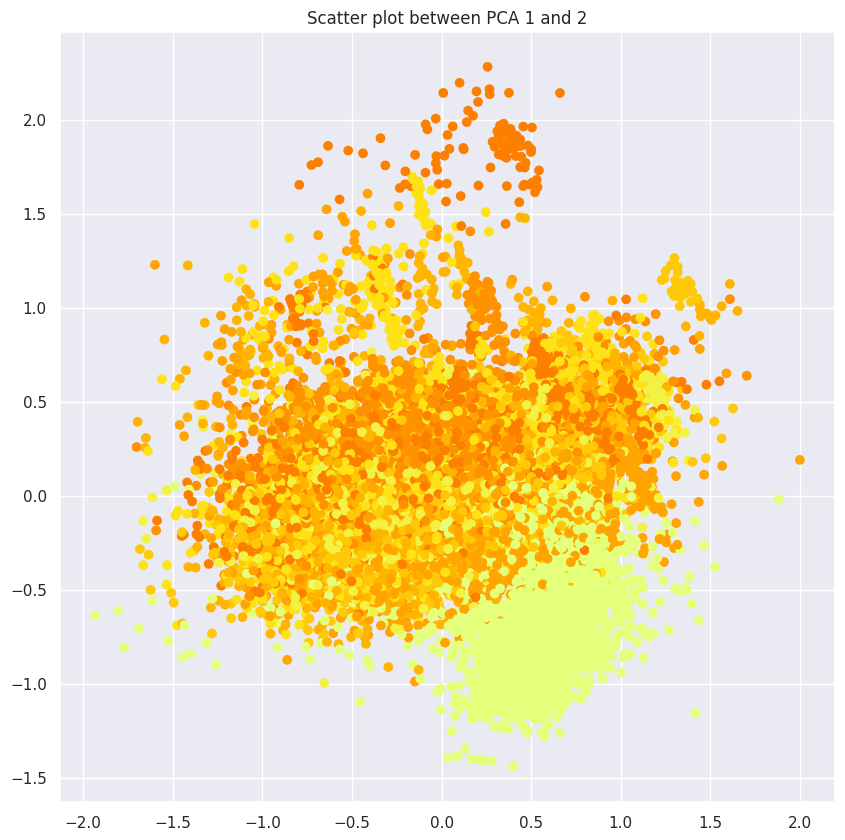

In [ ]:
Xpca = pca.fit_transform(X_mms)
plt.scatter(Xpca[:,0], Xpca[:,1], c=y, cmap='Wistia')
plt.title('Scatter plot between PCA 1 and 2')
plt.show()

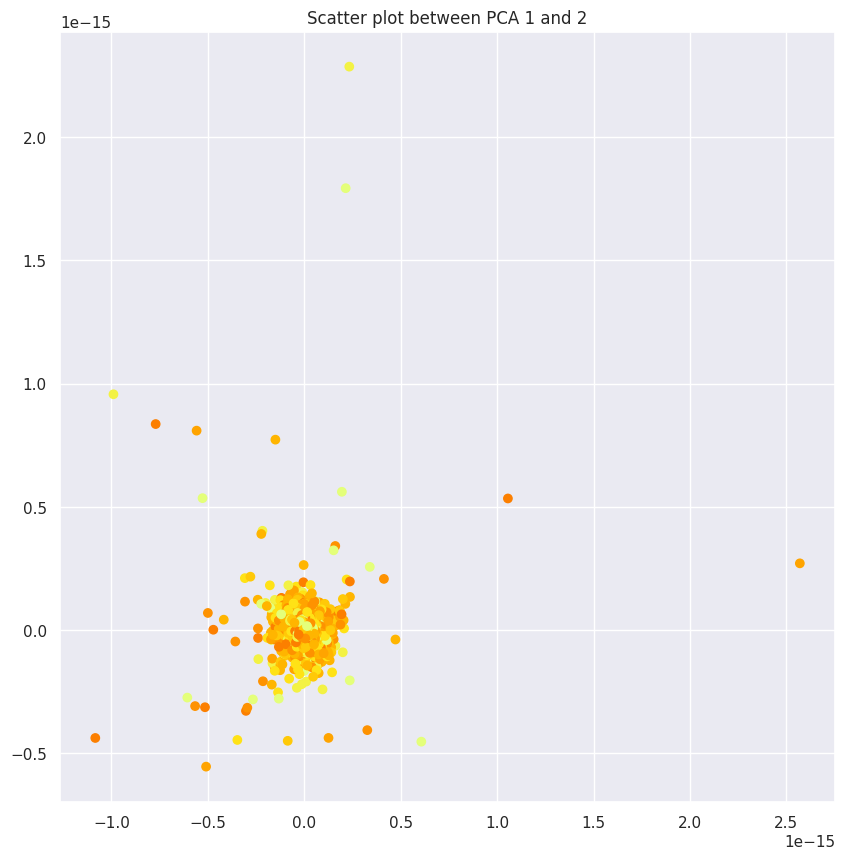

In [ ]:
Xpca = pca.fit_transform(X_mms)
plt.scatter(Xpca[:,-1], Xpca[:,-2], c=y, cmap='Wistia')
plt.title('Scatter plot between PCA 1 and 2')
plt.show()

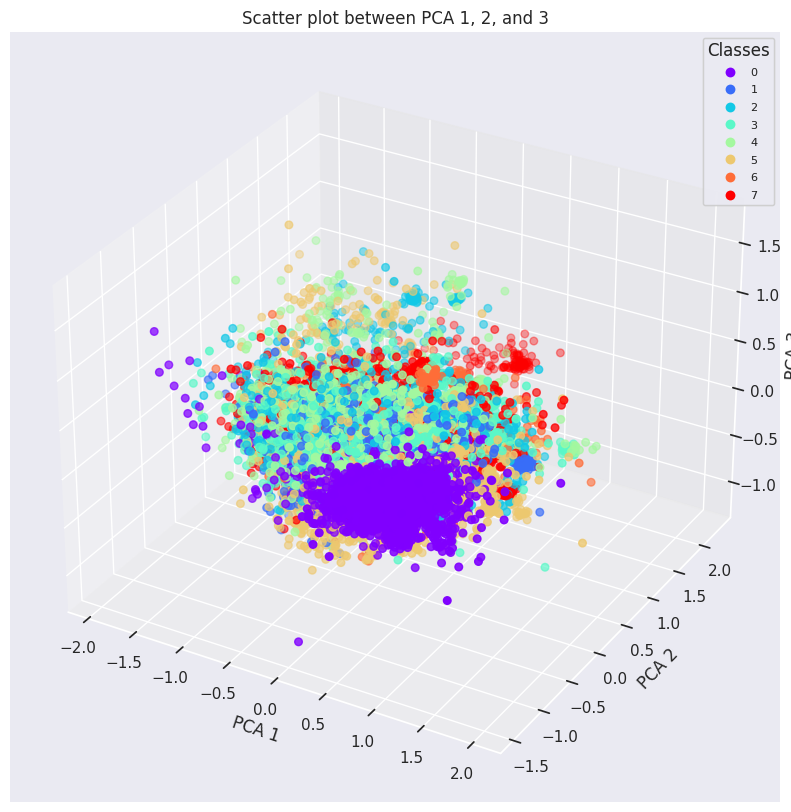

In [ ]:
Xpca = pca.fit_transform(X_mms)
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(Xpca[:,0], Xpca[:,1], Xpca[:,2], c=y, cmap='rainbow', s=30)
ax.set_title('Scatter plot between PCA 1, 2, and 3')
ax.set_xlabel('PCA 1')
ax.set_ylabel('PCA 2')
ax.set_zlabel('PCA 3')
legend = ax.legend(*scatter.legend_elements(), title="Classes", loc="upper right", fontsize=8)
ax.add_artist(legend)
plt.show()

In [ ]:
enzymeDf = enzymeDf.drop(columns=corr_features_to_remove)
print(enzymeDf.shape)

(21000, 551)


In [ ]:

y = enzymeDf['Class']
X = enzymeDf.drop(['Name','Seq','Class','index'],axis=1)

# Printing the shape of the dataframe
print('Shape of X: ',X.shape[0],X.shape[1])
print('Shape of y: ',y.shape[0])

# Splitting the data
X_, X_test, y_, y_test = train_test_split(X, y, test_size=0.20, random_state=1, stratify=y)
X_train, X_valid, y_train, y_valid = train_test_split(X_, y_, test_size=0.20, random_state=1, stratify=y_)

# Printing the shape of each sets
print('\nTraining set:   ',X_train.shape[0])
print('Validation set: ',X_valid.shape[0])
print('Testing set:    ',X_test.shape[0])

Shape of X:  21000 547
Shape of y:  21000

Training set:    13440
Validation set:  3360
Testing set:     4200


In [ ]:
scaler = MinMaxScaler()
scaler.fit(X_)
X_mms =  pd.DataFrame(scaler.transform(X_), index=X_.index, columns=X_.columns)
X_train_mms =  pd.DataFrame(scaler.transform(X_train), index=X_train.index, columns=X_train.columns)
X_valid_mms =  pd.DataFrame(scaler.transform(X_valid), index=X_valid.index, columns=X_valid.columns)
X_test_mms = pd.DataFrame(scaler.transform(X_test), index=X_test.index, columns=X_test.columns)

In [ ]:
values_train,freq_train = np.unique(y_train, return_counts=True)
print('Training  ', values_train,freq_train)

values_valid,freq_valid = np.unique(y_valid, return_counts=True)
print('Validation',values_valid,freq_valid)

values_test,freq_test = np.unique(y_test, return_counts=True)
print('Testing   ',values_test,freq_test)

Training   [0 1 2 3 4 5 6 7] [1920 1494 1550 1701 1602 1644 1763 1766]
Validation [0 1 2 3 4 5 6 7] [480 373 388 425 400 411 441 442]
Testing    [0 1 2 3 4 5 6 7] [600 466 485 531 501 514 551 552]


In [ ]:
from sklearn.metrics import accuracy_score, f1_score, matthews_corrcoef, confusion_matrix, ConfusionMatrixDisplay, classification_report

In [ ]:
!pip install -U scikit-learn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from sklearn.metrics import confusion_matrix

In [ ]:
from sklearn.metrics import f1_score, matthews_corrcoef

In [ ]:
from sklearn.metrics import accuracy_score, f1_score , matthews_corrcoef

def modelling(optimized_model, allModel, X_train, y_train, X_valid, y_valid, X_test, y_test):
    
    """ The function gets a dictionary for the model (optimized_model), empty dataframe (allModel) to store results 
    for different models, and train, validation and test features and the target as an input.
    
    For each model the function trains the model with train dataset and predict the target for train, test and 
    validation datasets. 
    
    The performance of each dataset is evaluated and added to the dataframe which will be the output for the function"""
    
    # Assign the model and train the data
    model = optimized_model['model']
    model.fit(X_train, y_train)
    
    # Predict the target using trained model
    y_pred_train = model.predict(X_train)    
    y_pred_valid = model.predict(X_valid)
    y_pred_test = model.predict(X_test)
    
    # Stat Calculations for the testing set
    accuracy_test = accuracy_score(y_test, y_pred_test) * 100
    # f1_weighted_test = f1_score(y_test, y_pred_test, average='weighted') * 100
    f1_negative_test = f1_score(y_test, y_pred_test, average='weighted', labels=classes, pos_label=0)
    f1_positive_test = f1_score(y_test, y_pred_test, average='weighted', labels=classes)
    mcc_test = matthews_corrcoef(y_test, y_pred_test) * 100
    
    # Stat Calculations for the training set
    accuracy_train = accuracy_score(y_train, y_pred_train) * 100
    # f1_weighted_train = f1_score(y_train, y_pred_train, average='weighted') * 100
    f1_negative_train = f1_score(y_train, y_pred_train, average='weighted', labels=classes, pos_label=0)
    f1_positive_train = f1_score(y_train, y_pred_train, average='weighted', labels=classes)
    mcc_train = matthews_corrcoef(y_train, y_pred_train) * 100
    
    # Stat Calculations for the Validation set
    accuracy_valid = accuracy_score(y_valid, y_pred_valid) * 100
    # f1_weighted_valid = f1_score(y_valid, y_pred_valid, average='weighted') * 100
    f1_negative_valid = f1_score(y_valid, y_pred_valid, average='weighted', labels=classes, pos_label=0)
    f1_positive_valid = f1_score(y_valid, y_pred_valid, average='weighted', labels=classes)
    mcc_valid = matthews_corrcoef(y_valid, y_pred_valid) * 100
    
    # create new dictionary for the current model and convert it into dataframe
    currentModel = {'Name': optimized_model['name'], 
                    'Train Accuracy': accuracy_train,
                    'Train F1 Negative':f1_negative_train,
                    'Train F1 Positive': f1_positive_train, 
                    'Train MCC Score': mcc_train,
                    'Validation Accuracy': accuracy_valid,
                    'Validation F1 Negative':f1_negative_valid,
                    'Validation F1 Positive': f1_positive_valid,
                    'Validation MCC Score': mcc_valid,
                    'Test Accuracy': accuracy_test,
                    'Test F1 Negative':f1_negative_test,
                    'Test F1 Positive': f1_positive_test,
                    'Test MCC Score': mcc_test}
    currentModel = pd.DataFrame(currentModel, index=[0])
    
    # Concatenate currentModel dataframe to allModel dataframe
    allModel = pd.concat([allModel, currentModel], ignore_index=True)
    
    return allModel


In [ ]:

"""Call the functions of the selected ML algorithms
   The parameters of each model are selected through Randomized Search CV method"""

svc_rbf = SVC()
svc_lin = SVC()
logistic = LogisticRegression()
random = RandomForestClassifier()
knn = KNeighborsClassifier()
xgb = XGBClassifier()

# Create dictionary for each models
svm_rbf_model = {'name':'SVM RBF','model':svc_rbf}
svm_linear_model = {'name':'SVM Linear','model':svc_lin}
logistic_model = {'name':'Logistic Regression','model':logistic}
random_model = {'name':'Random Forest','model':random}
knn_model = {'name':'KNNeighbor','model':knn}
xgboost_model = {'name':'XGBooster','model':xgb}

# collect all the models in a list
all_models = [svm_rbf_model, svm_linear_model, logistic_model, random_model, knn_model, xgboost_model]

In [ ]:
# ignore warnings
import warnings
warnings.filterwarnings('ignore')

# Creating empty dataframe to store the performance metrics
df = pd.DataFrame(columns = ['Name', 'Train Accuracy', 'Train F1 Negative', 'Train F1 Positive', 'Train MCC Score', 
                 'Validation Accuracy', 'Validation F1 Negative', 'Validation F1 Positive', 'Validation MCC Score',
                'Test Accuracy','Test F1 Negative','Test F1 Positive','Test MCC Score'])

# Loop through all the model and call modelling function to get the performance metrics of all the model
for i in all_models:
    df = modelling(i, df, X_train, y_train, X_valid, y_valid, X_test, y_test)
df

,Name,Train Accuracy,Train F1 Negative,Train F1 Positive,Train MCC Score,Validation Accuracy,Validation F1 Negative,Validation F1 Positive,Validation MCC Score,Test Accuracy,Test F1 Negative,Test F1 Positive,Test MCC Score
0,SVM RBF,33.422619,0.259047,0.259047,25.291169,33.571429,0.266105,0.266105,25.451162,33.380952,0.258423,0.258423,25.219437
1,SVM Linear,33.422619,0.259047,0.259047,25.291169,33.571429,0.266105,0.266105,25.451162,33.380952,0.258423,0.258423,25.219437
2,Logistic Regression,50.104167,0.494626,0.494626,42.965873,47.470238,0.468370,0.468370,39.948717,48.547619,0.478138,0.478138,41.185345
3,Random Forest,99.992560,0.999926,0.999926,99.991490,89.196429,0.892226,0.892226,87.673821,88.523810,0.885443,0.885443,86.900691
4,KNNeighbor,88.772321,0.887762,0.887762,87.175191,84.047619,0.840279,0.840279,81.765764,83.500000,0.834598,0.834598,81.149738
5,XGBooster,99.992560,0.999926,0.999926,99.991490,91.220238,0.912533,0.912533,89.970768,91.428571,0.914710,0.914710,90.211554


#XGBoost Training 

In [ ]:
from xgboost import XGBClassifier

# Create an instance of XGBoost classifier
xgb = XGBClassifier()

# Train the model on the training dataset
xgb.fit(X_train, y_train)

# Predict the target labels for the training, validation, and test datasets
y_pred_train = xgb.predict(X_train)
y_pred_valid = xgb.predict(X_valid)
y_pred_test = xgb.predict(X_test)


In [ ]:
# Define the input sequence
input_sequence = "MGVRHSASKDYIAGRPLVPGEAPLDKKNSNFSSWKPVTEIDDRDAKCADNWVPRHPDLIR LTGKHPFNSEPPHADVMKEGWLTPVSMHFVRNHGAVPRLEWGSHRITITGLVERPMEITM"

# Preprocess the input sequence (if needed) to match the format used during training

# Convert the input sequence into a format compatible with the model
input_data = preprocess_input(input_sequence)  # Replace preprocess_input with your actual preprocessing steps

# Predict the output label using the trained XGBoost model
predicted_label = xgb.predict(input_data)

# Print the predicted label
print("Predicted Label:", predicted_label)


In [ ]:
# Feature Extraction
from Bio.SeqUtils.ProtParam import ProteinAnalysis
from itertools import chain
import pandas as pd
import glob
from Bio import SeqIO

def preprocess_input(sequence):
    # Replace any unappropriate characters in the input sequence
    sequence = sequence.replace('X', 'A')
    sequence = sequence.replace('x', 'A')
    sequence = sequence.replace('U', 'A')
    sequence = sequence.replace('Z', 'A')
    sequence = sequence.replace('B', 'A')
    sequence = sequence.replace('O', 'A')
    
    # Return the preprocessed input sequence
    return sequence

def ExtractFeaturesFasta(sequence):
    # Preprocess the input sequence
    preprocessed_sequence = preprocess_input(sequence)

    # Create lists for features
    listing = []
    IDname = ['Name', 'Seq']
    Pname = ['SeqLength', 'Weight', 'Aromaticity', 'Instability', 'IsoelectricPoint']
    AACname, CTDname, DPCname = [], [], []

    # Calculate primary features for the preprocessed sequence
    analysed_seq = ProteinAnalysis(preprocessed_sequence)
    wt = analysed_seq.molecular_weight()
    arm = analysed_seq.aromaticity()
    instab = analysed_seq.instability_index()
    pI = analysed_seq.isoelectric_point()

    # Create lists for primary features
    pId = ['Input', preprocessed_sequence]
    pFeatures = [len(preprocessed_sequence), wt, arm, instab, pI]

    # Get Amino Acid Composition (AAC), Composition Transition Distribution (CTD), and Dipeptide Composition (DPC)
    resultAAC = AAComposition.CalculateAAComposition(preprocessed_sequence)
    resultCTD = CTD.CalculateCTD(preprocessed_sequence)
    resultDPC = AAComposition.CalculateDipeptideComposition(preprocessed_sequence)

    # Collect all the features into lists
    aacFeatures = [j for i, j in resultAAC.items()]
    ctdFeatures = [l for k, l in resultCTD.items()]
    dpcFeatures = [n for m, n in resultDPC.items()]
    listing.append(pId + pFeatures + aacFeatures + ctdFeatures + dpcFeatures)

    # Collect feature names
    AACname = [i for i, j in resultAAC.items()]
    CTDname = [k for k, l in resultCTD.items()]
    DPCname = [m for m, n in resultDPC.items()]
    feature_names = []
    feature_names.append(IDname + Pname + AACname + DPCname + CTDname)
    flatten_list = list(chain.from_iterable(feature_names))

    # Create a dataframe using all extracted features and the names
    allFeatures = pd.DataFrame(listing, columns=flatten_list)

    # Create a dictionary containing all sets of feature names
    allFearuresName = {'primary': Pname, 'AAC': AACname, 'CTD': CTDname, 'DPC': DPCname}

    return allFeatures, allFearuresName


In [ ]:
# Define the input sequence
input_sequence = "MGVRHSASKDYIAGRPLVPGEAPLDKKNSNFSSWKPVTEIDDRDAKCADNWVPRHPDLIRLTGKHPFNSEPPHADVMKEGWLTPVSMHFVRNHGAVPRLEWGSHR"



The shape of the input sequence dataframe
Number of rows:     1
Number of columns:  574


,Name,Seq,SeqLength,Weight,Aromaticity,Instability,IsoelectricPoint,A,R,N,D,C,E,Q,G,H,I,L,K,M,F,P,S,T,W,Y,V,AA,AR,AN,AD,AC,AE,AQ,AG,AH,AI,AL,AK,AM,AF,AP,AS,AT,AW,AY,AV,RA,RR,RN,RD,RC,RE,RQ,RG,RH,RI,RL,RK,RM,RF,RP,RS,RT,RW,RY,RV,NA,NR,NN,ND,NC,NE,NQ,NG,NH,NI,NL,NK,NM,NF,NP,NS,NT,NW,NY,NV,DA,DR,DN,DD,DC,DE,DQ,DG,DH,DI,DL,DK,DM,DF,DP,DS,DT,DW,DY,DV,CA,CR,CN,CD,CC,CE,CQ,CG,CH,CI,CL,CK,CM,CF,CP,CS,CT,CW,CY,CV,EA,ER,EN,ED,EC,EE,EQ,EG,EH,EI,EL,EK,EM,EF,EP,ES,ET,EW,EY,EV,QA,QR,QN,QD,QC,QE,QQ,QG,QH,QI,QL,QK,QM,QF,QP,QS,QT,QW,QY,QV,GA,GR,GN,GD,GC,GE,GQ,GG,GH,GI,GL,GK,GM,GF,GP,GS,GT,GW,GY,GV,HA,HR,HN,HD,HC,HE,HQ,HG,HH,HI,HL,HK,HM,HF,HP,HS,HT,HW,HY,HV,IA,IR,IN,ID,IC,IE,IQ,IG,IH,II,IL,IK,IM,IF,IP,IS,IT,IW,IY,IV,LA,LR,LN,LD,LC,LE,LQ,LG,LH,LI,LL,LK,LM,LF,LP,LS,LT,LW,LY,LV,KA,KR,KN,KD,KC,KE,KQ,KG,KH,KI,KL,KK,KM,KF,KP,KS,KT,KW,KY,KV,MA,MR,MN,MD,MC,ME,MQ,MG,MH,MI,ML,MK,MM,MF,MP,MS,MT,MW,MY,MV,FA,FR,FN,FD,FC,FE,FQ,FG,FH,FI,FL,FK,FM,FF,FP,FS,FT,FW,FY,FV,PA,PR,PN,PD,PC,PE,PQ,PG,PH,PI,PL,PK,PM,PF,PP,PS,PT,PW,PY,PV,SA,SR,SN,SD,SC,SE,SQ,SG,SH,SI,SL,SK,SM,SF,SP,SS,ST,SW,SY,SV,TA,TR,TN,TD,TC,TE,TQ,TG,TH,TI,TL,TK,TM,TF,TP,TS,TT,TW,TY,TV,WA,WR,WN,WD,WC,WE,WQ,WG,WH,WI,WL,WK,WM,WF,WP,WS,WT,WW,WY,WV,YA,YR,YN,YD,YC,YE,YQ,YG,YH,YI,YL,YK,YM,YF,YP,YS,YT,YW,YY,YV,VA,VR,VN,VD,VC,VE,VQ,VG,VH,VI,VL,VK,VM,VF,VP,VS,VT,VW,VY,VV,_PolarizabilityC1,_PolarizabilityC2,_PolarizabilityC3,_SolventAccessibilityC1,_SolventAccessibilityC2,_SolventAccessibilityC3,_SecondaryStrC1,_SecondaryStrC2,_SecondaryStrC3,_ChargeC1,_ChargeC2,_ChargeC3,_PolarityC1,_PolarityC2,_PolarityC3,_NormalizedVDWVC1,_NormalizedVDWVC2,_NormalizedVDWVC3,_HydrophobicityC1,_HydrophobicityC2,_HydrophobicityC3,_PolarizabilityT12,_PolarizabilityT13,_PolarizabilityT23,_SolventAccessibilityT12,_SolventAccessibilityT13,_SolventAccessibilityT23,_SecondaryStrT12,_SecondaryStrT13,_SecondaryStrT23,_ChargeT12,_ChargeT13,_ChargeT23,_PolarityT12,_PolarityT13,_PolarityT23,_NormalizedVDWVT12,_NormalizedVDWVT13,_NormalizedVDWVT23,_HydrophobicityT12,_HydrophobicityT13,_HydrophobicityT23,_PolarizabilityD1001,_PolarizabilityD1025,_PolarizabilityD1050,_PolarizabilityD1075,_PolarizabilityD1100,_PolarizabilityD2001,_PolarizabilityD2025,_PolarizabilityD2050,_PolarizabilityD2075,_PolarizabilityD2100,_PolarizabilityD3001,_PolarizabilityD3025,_PolarizabilityD3050,_PolarizabilityD3075,_PolarizabilityD3100,_SolventAccessibilityD1001,_SolventAccessibilityD1025,_SolventAccessibilityD1050,_SolventAccessibilityD1075,_SolventAccessibilityD1100,_SolventAccessibilityD2001,_SolventAccessibilityD2025,_SolventAccessibilityD2050,_SolventAccessibilityD2075,_SolventAccessibilityD2100,_SolventAccessibilityD3001,_SolventAccessibilityD3025,_SolventAccessibilityD3050,_SolventAccessibilityD3075,_SolventAccessibilityD3100,_SecondaryStrD1001,_SecondaryStrD1025,_SecondaryStrD1050,_SecondaryStrD1075,_SecondaryStrD1100,_SecondaryStrD2001,_SecondaryStrD2025,_SecondaryStrD2050,_SecondaryStrD2075,_SecondaryStrD2100,_SecondaryStrD3001,_SecondaryStrD3025,_SecondaryStrD3050,_SecondaryStrD3075,_SecondaryStrD3100,_ChargeD1001,_ChargeD1025,_ChargeD1050,_ChargeD1075,_ChargeD1100,_ChargeD2001,_ChargeD2025,_ChargeD2050,_ChargeD2075,_ChargeD2100,_ChargeD3001,_ChargeD3025,_ChargeD3050,_ChargeD3075,_ChargeD3100,_PolarityD1001,_PolarityD1025,_PolarityD1050,_PolarityD1075,_PolarityD1100,_PolarityD2001,_PolarityD2025,_PolarityD2050,_PolarityD2075,_PolarityD2100,_PolarityD3001,_PolarityD3025,_PolarityD3050,_PolarityD3075,_PolarityD3100,_NormalizedVDWVD1001,_NormalizedVDWVD1025,_NormalizedVDWVD1050,_NormalizedVDWVD1075,_NormalizedVDWVD1100,_NormalizedVDWVD2001,_NormalizedVDWVD2025,_NormalizedVDWVD2050,_NormalizedVDWVD2075,_NormalizedVDWVD2100,_NormalizedVDWVD3001,_NormalizedVDWVD3025,_NormalizedVDWVD3050,_NormalizedVDWVD3075,_NormalizedVDWVD3100,_HydrophobicityD1001,_HydrophobicityD1025,_HydrophobicityD1050,_HydrophobicityD1075,_HydrophobicityD1100,_HydrophobicityD2001,_HydrophobicityD2025,_HydrophobicityD2050,_HydrophobicityD2075,_HydrophobicityD2100,_HydrophobicityD3001,_Hyd

#FINDING MCC SCORE FOR EACH CLASS

In [ ]:
def mcc_2_modelling(optimized_model, allModel_mcc, X_train, y_train, X_valid, y_valid, X_test, y_test):
    """
    The function gets a dictionary for the model (optimized_model), empty dataframe (allModel) to store results 
    for different models, and train, validation and test features and the target as an input.
    
    For each model the function trains the model with train dataset and predicts the target for train, test and 
    validation datasets. 
    
    The performance of each dataset is evaluated and added to the dataframe which will be the output for the function.
    """
    
    # Assign the model and train the data
    model = optimized_model['model']
    model.fit(X_train, y_train)
    
    # Predict the target using trained model
    y_pred_train = model.predict(X_train)    
    y_pred_valid = model.predict(X_valid)
    y_pred_test = model.predict(X_test)
    
    # Get the number of classes in the target variable
    num_classes = 8
    
    # Create lists to store the performance metrics for each class
    accuracy_train = []
    f1_positive_train = []
    f1_negative_train = []
    mcc_train_positive = []
    mcc_train_negative = []
    accuracy_valid = []
    f1_positive_valid = []
    f1_negative_valid = []
    mcc_valid_positive = []
    mcc_valid_negative = []
    accuracy_test = []
    f1_positive_test = []
    f1_negative_test = []
    mcc_test_positive = []
    mcc_test_negative = []
    
    # Loop through all the classes in the target variable
    for i in range(num_classes):
        
        # Calculate the performance metrics for the current class
        y_train_i = (y_train == i).astype(int)
        y_valid_i = (y_valid == i).astype(int)
        y_test_i = (y_test == i).astype(int)
        y_pred_train_i = (y_pred_train == i).astype(int)
        y_pred_valid_i = (y_pred_valid == i).astype(int)
        y_pred_test_i = (y_pred_test == i).astype(int)
        
        accuracy_train_i = accuracy_score(y_train_i, y_pred_train_i)*100
        f1_positive_train_i = f1_score(y_train_i, y_pred_train_i)*100
        f1_negative_train_i = f1_score(1-y_train_i, 1-y_pred_train_i)*100
        mcc_train_positive_i = matthews_corrcoef(y_train_i, y_pred_train_i)*100
        mcc_train_negative_i = matthews_corrcoef(1-y_train_i, 1-y_pred_train_i)*100
        
        accuracy_valid_i = accuracy_score(y_valid_i, y_pred_valid_i)*100
        f1_positive_valid_i = f1_score(y_valid_i, y_pred_valid_i)*100
        f1_negative_valid_i = f1_score(1-y_valid_i, 1-y_pred_valid_i)*100
        mcc_valid_positive_i = matthews_corrcoef(y_valid_i, y_pred_valid_i)*100
        mcc_valid_negative_i = matthews_corrcoef(1-y_valid_i, 1-y_pred_valid_i)*100


        accuracy_test_i = accuracy_score(y_test_i, y_pred_test_i)*100
        f1_positive_test_i = f1_score(y_test_i, y_pred_test_i)*100
        f1_negative_test_i = f1_score(1-y_test_i, 1-y_pred_test_i)*100
        mcc_test_positive_i = matthews_corrcoef(y_test_i, y_pred_test_i)*100
        mcc_test_negative_i = matthews_corrcoef(1-y_test_i, 1-y_pred_test_i)*100
        print(mcc_test_positive_i,mcc_test_negative_i)

        # Append the performance metrics to the respective lists
        accuracy_train.append(accuracy_train_i)
        f1_positive_train.append(f1_positive_train_i)
        f1_negative_train.append(f1_negative_train_i)
        mcc_train_positive.append(mcc_train_positive_i)
        mcc_train_negative.append(mcc_train_negative_i)
        accuracy_valid.append(accuracy_valid_i)
        f1_positive_valid.append(f1_positive_valid_i)
        f1_negative_valid.append(f1_negative_valid_i)
        mcc_valid_positive.append(mcc_valid_positive_i)
        mcc_valid_negative.append(mcc_valid_negative_i)
        accuracy_test.append(accuracy_test_i)
        f1_positive_test.append(f1_positive_test_i)
        f1_negative_test.append(f1_negative_test_i)
        mcc_test_positive.append(mcc_test_positive_i)
        mcc_test_negative.append(mcc_test_negative_i)
    
        # Add the performance metrics for all classes to the dataframe
    all_2Model = {'Model': optimized_model['name'],
                              'Accuracy_Train_Class_0': accuracy_train[0], 'Accuracy_Train_Class_1': accuracy_train[1], 
                              'Accuracy_Train_Class_2': accuracy_train[2], 'Accuracy_Train_Class_3': accuracy_train[3], 
                              'Accuracy_Train_Class_4': accuracy_train[4], 'Accuracy_Train_Class_5': accuracy_train[5], 
                              'Accuracy_Train_Class_6': accuracy_train[6], 'Accuracy_Train_Class_7': accuracy_train[7],
                              'Accuracy_Valid_Class_0': accuracy_valid[0], 'Accuracy_Valid_Class_1': accuracy_valid[1], 
                              'Accuracy_Valid_Class_2': accuracy_valid[2], 'Accuracy_Valid_Class_3': accuracy_valid[3], 
                              'Accuracy_Valid_Class_4': accuracy_valid[4], 'Accuracy_Valid_Class_5': accuracy_valid[5], 
                              'Accuracy_Valid_Class_6': accuracy_valid[6], 'Accuracy_Valid_Class_7': accuracy_valid[7],
                              'Accuracy_Test_Class_0': accuracy_test[0], 'Accuracy_Test_Class_1': accuracy_test[1], 
                              'Accuracy_Test_Class_2': accuracy_test[2], 'Accuracy_Test_Class_3': accuracy_test[3], 
                              'Accuracy_Test_Class_4': accuracy_test[4], 'Accuracy_Test_Class_5': accuracy_test[5], 
                              'Accuracy_Test_Class_6': accuracy_test[6], 'Accuracy_Test_Class_7': accuracy_test[7],
                              'F1_Positive_Train_Class_0': f1_positive_train[0], 'F1_Positive_Train_Class_1': f1_positive_train[1], 
                              'F1_Positive_Train_Class_2': f1_positive_train[2], 'F1_Positive_Train_Class_3': f1_positive_train[3],
                              'F1_Positive_Train_Class_4': f1_positive_train[4], 'F1_Positive_Train_Class_5': f1_positive_train[5],
                              'F1_Positive_Train_Class_6': f1_positive_train[6], 'F1_Positive_Train_Class_7': f1_positive_train[7],
                              'F1_Positive_Valid_Class_0': f1_positive_valid[0], 'F1_Positive_Valid_Class_1': f1_positive_valid[1],
                              'F1_Positive_Valid_Class_2': f1_positive_valid[2], 'F1_Positive_Valid_Class_3': f1_positive_valid[3],
                              'F1_Positive_Valid_Class_4': f1_positive_valid[4], 'F1_Positive_Valid_Class_5': f1_positive_valid[5],
                              'F1_Positive_Valid_Class_6': f1_positive_valid[6], 'F1_Positive_Valid_Class_7': f1_positive_valid[7],
                              'F1_Positive_Test_Class_0': f1_positive_test[0], 'F1_Positive_Test_Class_1': f1_positive_test[1],
                              'F1_Positive_Test_Class_2': f1_positive_test[2], 'F1_Positive_Test_Class_3': f1_positive_test[3],
                              'F1_Positive_Test_Class_4': f1_positive_test[4], 'F1_Positive_Test_Class_5': f1_positive_test[5],
                              'F1_Positive_Test_Class_6': f1_positive_test[6], 'F1_Positive_Test_Class_7': f1_positive_test[7],
                              'F1_Negative_Train_Class_0': f1_negative_train[0], 'F1_Negative_Train_Class_1': f1_negative_train[1],
                              'F1_Negative_Train_Class_2': f1_negative_train[2], 'F1_Negative_Train_Class_3': f1_negative_train[3],
                              'F1_Negative_Train_Class_4': f1_negative_train[4], 'F1_Negative_Train_Class_5': f1_negative_train[5],
                              'F1_Negative_Train_Class_6': f1_negative_train[6], 'F1_Negative_Train_Class_7': f1_negative_train[7],
                              'F1_Negative_Valid_Class_0': f1_negative_valid[0], 'F1_Negative_Valid_Class_1': f1_negative_valid[1],
                              'F1_Negative_Valid_Class_2': f1_negative_valid[2], 'F1_Negative_Valid_Class_3': f1_negative_valid[3],
                              'F1_Negative_Valid_Class_4': f1_negative_valid[4], 'F1_Negative_Valid_Class_5': f1_negative_valid[5],
                              'F1_Negative_Valid_Class_6': f1_negative_valid[6], 'F1_Negative_Valid_Class_7': f1_negative_valid[7],
                              'F1_Negative_Test_Class_0': f1_negative_test[0], 'F1_Negative_Test_Class_1': f1_negative_test[1],
                              'F1_Negative_Test_Class_2': f1_negative_test[2], 'F1_Negative_Test_Class_3': f1_negative_test[3],
                              'F1_Negative_Test_Class_4': f1_negative_test[4], 'F1_Negative_Test_Class_5': f1_negative_test[5],
                              'F1_Negative_Test_Class_6': f1_negative_test[6], 'F1_Negative_Test_Class_7': f1_negative_test[7],
                              'mcc_positive_train_class_0':mcc_train_positive[0],'mcc_positive_train_class_1':mcc_train_positive[1],
                              'mcc_positive_train_class_2':mcc_train_positive[2],'mcc_positive_train_class_3':mcc_train_positive[3],
                              'mcc_positive_train_class_4':mcc_train_positive[4],'mcc_positive_train_class_5':mcc_train_positive[5],
                              'mcc_positive_train_class_6':mcc_train_positive[6],'mcc_positive_train_class_7':mcc_train_positive[7],
                              'mcc_positive_valid_class_0':mcc_valid_positive[0],'mcc_positive_valid_class_1':mcc_train_positive[1],
                              'mcc_positive_valid_class_2':mcc_train_positive[2],'mcc_positive_valid_class_3':mcc_train_positive[3],
                              'mcc_positive_valid_class_4':mcc_train_positive[4],'mcc_positive_valid_class_5':mcc_train_positive[5],
                              'mcc_positive_valid_class_6':mcc_train_positive[6],'mcc_positive_valid_class_7':mcc_train_positive[7],
                              'mcc_positive_test_class_0':mcc_train_positive[0],'mcc_positive_test_class_1':mcc_train_positive[1],
                              'mcc_positive_test_class_2':mcc_train_positive[2],'mcc_positive_test_class_3':mcc_train_positive[3],
                              'mcc_positive_test_class_4':mcc_train_positive[4],'mcc_positive_test_class_5':mcc_train_positive[5],
                              'mcc_positive_test_class_6':mcc_train_positive[6],'mcc_positive_test_class_7':mcc_train_positive[7],
                              'mcc_negative_train_class_0':mcc_train_negative[0],'mcc_negative_train_class_1':mcc_train_negative[1],
                              'mcc_negative_train_class_2':mcc_train_negative[2],'mcc_negative_train_class_3':mcc_train_negative[3],
                              'mcc_negative_train_class_4':mcc_train_negative[4],'mcc_negative_train_class_5':mcc_train_negative[5],
                              'mcc_negative_train_class_6':mcc_train_negative[6],'mcc_negative_train_class_7':mcc_train_negative[7],
                              'mcc_negative_valid_class_0':mcc_valid_negative[0],'mcc_negative_valid_class_1':mcc_train_negative[1],
                              'mcc_negative_valid_class_2':mcc_train_negative[2],'mcc_negative_valid_class_3':mcc_train_negative[3],
                              'mcc_negative_valid_class_4':mcc_train_negative[4],'mcc_negative_valid_class_5':mcc_train_negative[5],
                              'mcc_negative_valid_class_6':mcc_train_negative[6],'mcc_negative_valid_class_7':mcc_train_negative[7],
                              'mcc_negative_test_class_0':mcc_train_negative[0],'mcc_negative_test_class_1':mcc_train_negative[1],
                              'mcc_negative_test_class_2':mcc_train_negative[2],'mcc_negative_test_class_3':mcc_train_negative[3],
                              'mcc_negative_test_class_4':mcc_train_negative[4],'mcc_negative_test_class_5':mcc_train_negative[5],
                              'mcc_negative_test_class_6':mcc_train_negative[6],'mcc_negative_test_class_7':mcc_train_negative[7]}
                            
        
    all_2Model = pd.DataFrame(all_2Model, index=[0])
    
    # Concatenate currentModel dataframe to allModel dataframe
    allModel_mcc = pd.concat([allModel_mcc, all_2Model], ignore_index=True)
    
    return allModel_mcc



In [ ]:

"""Call the functions of the selected ML algorithms
   The parameters of each model are selected through Randomized Search CV method"""

svc_rbf = SVC()
svc_lin = SVC()
logistic = LogisticRegression()
random = RandomForestClassifier()
knn = KNeighborsClassifier()
xgb = XGBClassifier()

# Create dictionary for each models
svm_rbf_model = {'name':'SVM RBF','model':svc_rbf}
svm_linear_model = {'name':'SVM Linear','model':svc_lin}
logistic_model = {'name':'Logistic Regression','model':logistic}
random_model = {'name':'Random Forest','model':random}
knn_model = {'name':'KNNeighbor','model':knn}
xgboost_model = {'name':'XGBooster','model':xgb}

# collect all the models in a list
all_models_mcc = [svm_rbf_model, svm_linear_model, logistic_model, random_model, knn_model, xgboost_model]

In [ ]:
# ignore warnings
import warnings
warnings.filterwarnings('ignore')

# Creating empty dataframe to store the performance metrics
df_mcc = pd.DataFrame(columns = ['Model', 'Accuracy_Train_Class_0','Accuracy_Train_Class_1','Accuracy_Train_Class_2','Accuracy_Train_Class_3','Accuracy_Train_Class_4','Accuracy_Train_Class_5','Accuracy_Train_Class_6','Accuracy_Train_Class_7',
                             'Accuracy_Valid_Class_0','Accuracy_Valid_Class_1','Accuracy_Valid_Class_2','Accuracy_Valid_Class_3','Accuracy_Valid_Class_4','Accuracy_Valid_Class_5','Accuracy_Valid_Class_6','Accuracy_Valid_Class_7',
                             'Accuracy_Test_Class_0','Accuracy_Test_Class_1','Accuracy_Test_Class_2','Accuracy_Test_Class_3','Accuracy_Test_Class_4','Accuracy_Test_Class_5','Accuracy_Test_Class_6','Accuracy_Test_Class_7',
                             'F1_Positive_Train_Class_0','F1_Positive_Train_Class_1','F1_Positive_Train_Class_2','F1_Positive_Train_Class_3','F1_Positive_Train_Class_4','F1_Positive_Train_Class_5','F1_Positive_Train_Class_6','F1_Positive_Train_Class_7',
                             'F1_Positive_Valid_Class_0','F1_Positive_Valid_Class_1','F1_Positive_Valid_Class_2','F1_Positive_Valid_Class_3','F1_Positive_Valid_Class_4','F1_Positive_Valid_Class_5','F1_Positive_Valid_Class_6','F1_Positive_Valid_Class_7',
                             'F1_Positive_Test_Class_0','F1_Positive_Test_Class_1','F1_Positive_Test_Class_2','F1_Positive_Test_Class_3','F1_Positive_Test_Class_4','F1_Positive_Test_Class_5','F1_Positive_Test_Class_6','F1_Positive_Test_Class_7',
                             'F1_Negative_Train_Class_0','F1_Negative_Train_Class_1','F1_Negative_Train_Class_2','F1_Negative_Train_Class_3','F1_Negative_Train_Class_4','F1_Negative_Train_Class_5','F1_Negative_Train_Class_6','F1_Negative_Train_Class_7',
                             'F1_Negative_Valid_Class_0','F1_Negative_Valid_Class_1','F1_Negative_Valid_Class_2','F1_Negative_Valid_Class_3','F1_Negative_Valid_Class_4','F1_Negative_Valid_Class_5','F1_Negative_Valid_Class_6','F1_Negative_Valid_Class_7',
                             'F1_Negative_Test_Class_0','F1_Negative_Test_Class_1','F1_Negative_Test_Class_2','F1_Negative_Test_Class_3','F1_Negative_Test_Class_4','F1_Negative_Test_Class_5','F1_Negative_Test_Class_6','F1_Negative_Test_Class_7',
                             'mcc_positive_train_class_0','mcc_positive_train_class_1','mcc_positive_train_class_2','mcc_positive_train_class_3','mcc_positive_train_class_4','mcc_positive_train_class_5','mcc_positive_train_class_6','mcc_positive_train_class_7',
                             'mcc_positive_valid_class_0','mcc_positive_valid_class_1','mcc_positive_valid_class_2','mcc_positive_valid_class_3','mcc_positive_valid_class_4','mcc_positive_valid_class_5','mcc_positive_valid_class_6','mcc_positive_valid_class_7',
                             'mcc_positive_test_class_0','mcc_positive_test_class_1','mcc_positive_test_class_2','mcc_positive_test_class_3','mcc_positive_test_class_4','mcc_positive_test_class_5','mcc_positive_test_class_6','mcc_positive_test_class_7',
                             'mcc_negative_train_class_0','mcc_negative_train_class_1','mcc_negative_train_class_2','mcc_negative_train_class_3','mcc_negative_train_class_4','mcc_negative_train_class_5','mcc_negative_train_class_6','mcc_negative_train_class_7',
                             'mcc_negative_valid_class_0','mcc_negative_valid_class_1','mcc_negative_valid_class_2','mcc_negative_valid_class_3','mcc_negative_valid_class_4','mcc_negative_valid_class_5','mcc_negative_valid_class_6','mcc_negative_valid_class_7',
                             'mcc_negative_test_class_0','mcc_negative_test_class_1','mcc_negative_test_class_2','mcc_negative_test_class_3','mcc_negative_test_class_4','mcc_negative_test_class_5','mcc_negative_test_class_6','mcc_negative_test_class_7'])
# Loop through all the model and call modelling function to get the performance metrics of all the model
for i in all_models_mcc:
    df_mcc = modelling(i, df_mcc, X_train, y_train, X_valid, y_valid, X_test, y_test)
df_mcc

,Model,Accuracy_Train_Class_0,Accuracy_Train_Class_1,Accuracy_Train_Class_2,Accuracy_Train_Class_3,Accuracy_Train_Class_4,Accuracy_Train_Class_5,Accuracy_Train_Class_6,Accuracy_Train_Class_7,Accuracy_Valid_Class_0,Accuracy_Valid_Class_1,Accuracy_Valid_Class_2,Accuracy_Valid_Class_3,Accuracy_Valid_Class_4,Accuracy_Valid_Class_5,Accuracy_Valid_Class_6,Accuracy_Valid_Class_7,Accuracy_Test_Class_0,Accuracy_Test_Class_1,Accuracy_Test_Class_2,Accuracy_Test_Class_3,Accuracy_Test_Class_4,Accuracy_Test_Class_5,Accuracy_Test_Class_6,Accuracy_Test_Class_7,F1_Positive_Train_Class_0,F1_Positive_Train_Class_1,F1_Positive_Train_Class_2,F1_Positive_Train_Class_3,F1_Positive_Train_Class_4,F1_Positive_Train_Class_5,F1_Positive_Train_Class_6,F1_Positive_Train_Class_7,F1_Positive_Valid_Class_0,F1_Positive_Valid_Class_1,F1_Positive_Valid_Class_2,F1_Positive_Valid_Class_3,F1_Positive_Valid_Class_4,F1_Positive_Valid_Class_5,F1_Positive_Valid_Class_6,F1_Positive_Valid_Class_7,F1_Positive_Test_Class_0,F1_Positive_Test_Class_1,F1_Positive_Test_Class_2,F1_Positive_Test_Class_3,F1_Positive_Test_Class_4,F1_Positive_Test_Class_5,F1_Positive_Test_Class_6,F1_Positive_Test_Class_7,F1_Negative_Train_Class_0,F1_Negative_Train_Class_1,F1_Negative_Train_Class_2,F1_Negative_Train_Class_3,F1_Negative_Train_Class_4,F1_Negative_Train_Class_5,F1_Negative_Train_Class_6,F1_Negative_Train_Class_7,F1_Negative_Valid_Class_0,F1_Negative_Valid_Class_1,F1_Negative_Valid_Class_2,F1_Negative_Valid_Class_3,F1_Negative_Valid_Class_4,F1_Negative_Valid_Class_5,F1_Negative_Valid_Class_6,F1_Negative_Valid_Class_7,F1_Negative_Test_Class_0,F1_Negative_Test_Class_1,F1_Negative_Test_Class_2,F1_Negative_Test_Class_3,F1_Negative_Test_Class_4,F1_Negative_Test_Class_5,F1_Negative_Test_Class_6,F1_Negative_Test_Class_7,mcc_positive_train_class_0,mcc_positive_train_class_1,mcc_positive_train_class_2,mcc_positive_train_class_3,mcc_positive_train_class_4,mcc_positive_train_class_5,mcc_positive_train_class_6,mcc_positive_train_class_7,mcc_positive_valid_class_0,mcc_positive_valid_class_1,mcc_positive_valid_class_2,mcc_positive_valid_class_3,mcc_positive_valid_class_4,mcc_positive_valid_class_5,mcc_positive_valid_class_6,mcc_positive_valid_class_7,mcc_positive_test_class_0,mcc_positive_test_class_1,mcc_positive_test_class_2,mcc_positive_test_class_3,mcc_positive_test_class_4,mcc_positive_test_class_5,mcc_positive_test_class_6,mcc_positive_test_class_7,mcc_negative_train_class_0,mcc_negative_train_class_1,mcc_negative_train_class_2,mcc_negative_train_class_3,mcc_negative_train_class_4,mcc_negative_train_class_5,mcc_negative_train_class_6,mcc_negative_train_class_7,mcc_negative_valid_class_0,mcc_negative_valid_class_1,mcc_negative_valid_class_2,mcc_negative_valid_class_3,mcc_negative_valid_class_4,mcc_negative_valid_class_5,mcc_negative_valid_class_6,mcc_negative_valid_class_7,mcc_negative_test_class_0,mcc_negative_test_class_1,mcc_negative_test_class_2,mcc_negative_test_class_3,mcc_negative_test_class_4,mcc_negative_test_class_5,mcc_negative_test_class_6,mcc_negative_test_class_7,Name,Train Accuracy,Train F1 Negative,Train F1 Positive,Train MCC Score,Validation Accuracy,Validation F1 Negative,Validation F1 Positive,Validation MCC Score,Test Accuracy,Test F1 Negative,Test F1 Positive,Test MCC Score
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,SVM RBF,33.422619,0.259047,0.259047,25.291169,33.571429,0.266105,0.266105,25.451162,33.380952,0.258423,0.258423,25.219437
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N